In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from babyplots import Babyplot
import umap
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold


C:\Users\Nadun\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


In [2]:
ad_eGeMAPS_feature_set = pd.read_csv('audio_ad_eGeMAPS_files/ad_eGeMAPS_features.csv')

In [3]:
cn_eGeMAPS_feature_set = pd.read_csv('audio_cn_eGeMAPS_files/cn_eGeMAPS_features.csv')

In [4]:
ad_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:03:55.857074830,adrso024,22.836117,0.262548,17.961660,22.913454,25.896833,7.935173,174.19131,...,0.034473,-0.014542,0.163655,1.585821,1.204615,0.733627,1.335316,0.100488,0.248929,-26.253954
1,0 days,0 days 00:03:11.152086168,adrso025,25.950464,0.377482,19.555513,23.233688,31.419218,11.863705,276.19775,...,0.034837,-0.006407,0.069983,0.774302,2.271776,0.213387,0.261583,0.221147,0.338732,-32.320164
2,0 days,0 days 00:01:22.482698413,adrso027,19.768696,0.398335,13.725715,16.492744,24.860962,11.135247,335.64285,...,-0.004356,-0.007412,0.134296,0.727537,4.489747,0.099811,0.124493,0.112874,0.129176,-34.366104
3,0 days,0 days 00:01:02.211678005,adrso028,22.070637,0.463571,13.757698,17.229143,27.134663,13.376965,248.23643,...,0.013304,-0.011718,0.118246,0.482315,3.943980,0.174490,0.210899,0.069385,0.108286,-28.948114
4,0 days,0 days 00:01:21.176575964,adrso031,29.309093,0.360100,15.780171,32.175450,38.107906,22.327736,336.57800,...,-0.015987,-0.001244,0.083634,0.689995,2.601726,0.171469,0.250327,0.208814,0.223623,-35.530070


In [5]:
cn_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:01:18.058911565,adrso002,32.148743,0.195630,29.918198,32.302647,34.484608,4.566410,266.66245,...,0.018041,-0.009352,0.076599,2.498718,1.513209,0.488983,0.465185,0.165140,0.196879,-22.068342
1,0 days,0 days 00:00:33.624376417,adrso003,29.971436,0.210694,27.276344,29.303750,32.647003,5.370659,281.85820,...,0.014162,-0.011021,0.103602,2.856293,1.818182,0.387377,0.322785,0.167843,0.349360,-19.553001
2,0 days,0 days 00:01:01.765578231,adrso005,28.708685,0.202150,26.831608,29.339455,31.838795,5.007187,369.29947,...,0.005705,-0.005474,0.191949,1.878543,1.993840,0.407073,0.421165,0.086990,0.122362,-26.684572
3,0 days,0 days 00:00:26.162335601,adrso007,28.454863,0.273630,25.374147,27.646920,30.275562,4.901415,285.29285,...,0.019908,-0.006195,0.164116,2.944551,2.338957,0.263934,0.213743,0.151404,0.220641,-21.138330
4,0 days,0 days 00:00:50.926712018,adrso008,32.818066,0.208943,27.047916,34.046913,36.781120,9.733204,235.66933,...,0.015267,-0.012436,0.069859,2.514241,1.514854,0.465974,0.390621,0.202308,0.390549,-21.198547


In [6]:
print(ad_eGeMAPS_feature_set.shape)
print(cn_eGeMAPS_feature_set.shape)

(87, 91)
(79, 91)


In [7]:
test_eGeMAPS_feature_set = pd.read_csv('audio_test_eGeMAPS_files/test_eGeMAPS_features.csv')

In [8]:
test_eGeMAPS_feature_set.head()

,start,end,audio file,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
0,0 days,0 days 00:01:06.530952381,adrsdt01,26.933651,0.269920,22.011870,25.267350,31.166980,9.155111,271.53003,...,0.003571,-0.002427,0.020502,1.623572,1.098405,0.516849,0.731054,0.458814,0.498676,-22.297499
1,0 days,0 days 00:01:34.005442177,adrsdt02,27.392118,0.320830,21.840721,24.594528,36.107338,14.266617,358.62870,...,-0.001117,-0.007930,0.026394,0.851154,1.341425,0.222857,0.324499,0.498651,0.778048,-22.206453
2,0 days,0 days 00:01:13.116598639,adrsdt03,26.430683,0.283528,21.537598,26.227154,29.220562,7.682964,298.19595,...,0.039783,-0.004290,0.290363,1.805746,3.463855,0.193557,0.312213,0.086714,0.078241,-19.219969
3,0 days,0 days 00:01:38.135555556,adrsdt04,29.138786,0.364721,24.427902,25.229744,27.371542,2.943640,621.91290,...,0.018380,-0.001044,0.067567,0.611496,1.866014,0.275738,0.260786,0.288411,0.497746,-35.200470
4,0 days,0 days 00:00:38.578276644,adrsdt05,26.466581,0.263205,22.766111,25.472515,28.994644,6.228533,303.45227,...,0.018046,-0.007814,0.074368,2.074689,1.221097,0.611915,0.594115,0.202093,0.279730,-18.861200


In [9]:
# Drop start and end columns

ad_eGeMAPS_feature_set.drop(['start','end'],axis=1, inplace=True)
cn_eGeMAPS_feature_set.drop(['start','end'],axis=1,inplace=True)
test_eGeMAPS_feature_set.drop(['start','end'],axis=1,inplace=True)

In [10]:
# Set index column

ad_eGeMAPS_feature_set.set_index('audio file',inplace=True)
cn_eGeMAPS_feature_set.set_index('audio file',inplace=True)
test_eGeMAPS_feature_set.set_index('audio file',inplace=True)

In [11]:
ad_eGeMAPS_feature_set.head()

,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
audio file,,,,,,,,,,,,,,,,,,,,,
adrso024,22.836117,0.262548,17.961660,22.913454,25.896833,7.935173,174.19131,211.22704,150.88577,222.97878,...,0.034473,-0.014542,0.163655,1.585821,1.204615,0.733627,1.335316,0.100488,0.248929,-26.253954
adrso025,25.950464,0.377482,19.555513,23.233688,31.419218,11.863705,276.19775,456.58658,177.42262,236.37715,...,0.034837,-0.006407,0.069983,0.774302,2.271776,0.213387,0.261583,0.221147,0.338732,-32.320164
adrso027,19.768696,0.398335,13.725715,16.492744,24.860962,11.135247,335.64285,600.02450,167.47725,232.32630,...,-0.004356,-0.007412,0.134296,0.727537,4.489747,0.099811,0.124493,0.112874,0.129176,-34.366104
adrso028,22.070637,0.463571,13.757698,17.229143,27.134663,13.376965,248.23643,358.60715,147.31458,151.09753,...,0.013304,-0.011718,0.118246,0.482315,3.943980,0.174490,0.210899,0.069385,0.108286,-28.948114
adrso031,29.309093,0.360100,15.780171,32.175450,38.107906,22.327736,336.57800,512.88070,136.47410,149.77420,...,-0.015987,-0.001244,0.083634,0.689995,2.601726,0.171469,0.250327,0.208814,0.223623,-35.530070


In [12]:
test_truth = pd.read_csv('test_truth.csv')

In [13]:
test_truth.head()

,audio file,status
0,adrsdt15,cn
1,adrsdt40,cn
2,adrsdt26,cn
3,adrsdt67,cn
4,adrsdt58,cn


In [14]:
test_truth.set_index('audio file',inplace=True)

In [15]:
test_truth.head()

,status
audio file,
adrsdt15,cn
adrsdt40,cn
adrsdt26,cn
adrsdt67,cn
adrsdt58,cn


In [16]:
test_merged = test_eGeMAPS_feature_set.merge(test_truth, on ='audio file')

In [17]:
test_merged.head()

,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,...,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp,status
audio file,,,,,,,,,,,,,,,,,,,,,
adrsdt01,26.933651,0.269920,22.011870,25.267350,31.166980,9.155111,271.53003,471.62332,168.68524,323.89792,...,-0.002427,0.020502,1.623572,1.098405,0.516849,0.731054,0.458814,0.498676,-22.297499,ad
adrsdt02,27.392118,0.320830,21.840721,24.594528,36.107338,14.266617,358.62870,535.42720,215.63940,385.22693,...,-0.007930,0.026394,0.851154,1.341425,0.222857,0.324499,0.498651,0.778048,-22.206453,ad
adrsdt03,26.430683,0.283528,21.537598,26.227154,29.220562,7.682964,298.19595,392.68802,201.02250,383.58050,...,-0.004290,0.290363,1.805746,3.463855,0.193557,0.312213,0.086714,0.078241,-19.219969,cn
adrsdt04,29.138786,0.364721,24.427902,25.229744,27.371542,2.943640,621.91290,1000.60290,154.89940,277.15560,...,-0.001044,0.067567,0.611496,1.866014,0.275738,0.260786,0.288411,0.497746,-35.200470,ad
adrsdt05,26.466581,0.263205,22.766111,25.472515,28.994644,6.228533,303.45227,582.28625,152.52272,240.39737,...,-0.007814,0.074368,2.074689,1.221097,0.611915,0.594115,0.202093,0.279730,-18.861200,cn


In [18]:
# Create a column for status - ad or cn
ad_eGeMAPS_feature_set['status'] = 'ad'
cn_eGeMAPS_feature_set['status'] = 'cn'

In [19]:
# Combine the two data sets
combined_data = pd.concat([ad_eGeMAPS_feature_set, cn_eGeMAPS_feature_set,test_merged])
combined_data.shape

(237, 89)

# Let's see if we need to clean data

In [20]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 237 entries, adrso024 to adrsdt71
Data columns (total 89 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   F0semitoneFrom27.5Hz_sma3nz_amean               237 non-null    float64
 1   F0semitoneFrom27.5Hz_sma3nz_stddevNorm          237 non-null    float64
 2   F0semitoneFrom27.5Hz_sma3nz_percentile20.0      237 non-null    float64
 3   F0semitoneFrom27.5Hz_sma3nz_percentile50.0      237 non-null    float64
 4   F0semitoneFrom27.5Hz_sma3nz_percentile80.0      237 non-null    float64
 5   F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2        237 non-null    float64
 6   F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope     237 non-null    float64
 7   F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope   237 non-null    float64
 8   F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope    237 non-null    float64
 9   F0semitoneFrom27.5Hz_sma3nz_stddevFa

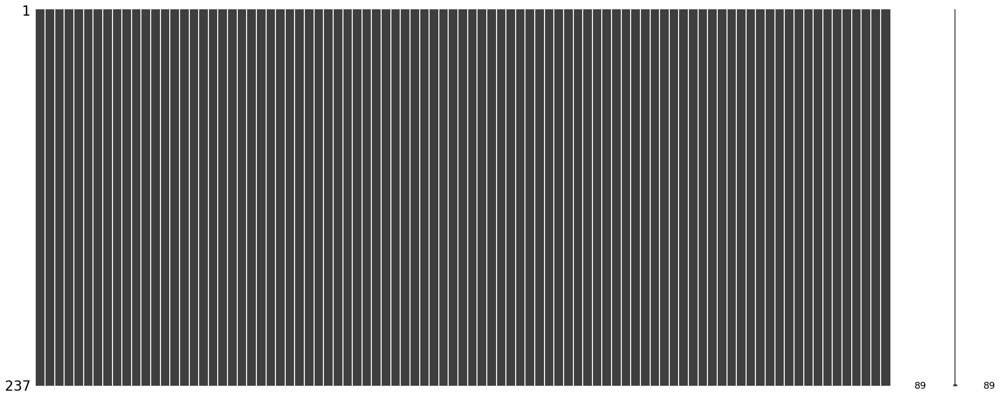

In [21]:
# Checking to see if there are null/Nan/missing values
msno.matrix(combined_data)
plt.show()

In [22]:
missing = pd.concat([combined_data.isnull().sum(), 100 * combined_data.isnull().mean()], axis=1)
missing.columns = ['count', '%']
missing.sort_values(by=['count','%'],ascending=False)

,count,%
F0semitoneFrom27.5Hz_sma3nz_amean,0,0.0
F0semitoneFrom27.5Hz_sma3nz_stddevNorm,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0,0.0
F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0,0.0
...,...,...
StddevVoicedSegmentLengthSec,0,0.0
MeanUnvoicedSegmentLength,0,0.0
StddevUnvoicedSegmentLength,0,0.0
equivalentSoundLevel_dBp,0,0.0


Looks like there are no missing/Nan values

In [23]:
combined_data.describe().T

,count,mean,std,min,25%,50%,75%,max
F0semitoneFrom27.5Hz_sma3nz_amean,237.0,28.748816,4.445856,15.725306,26.467016,29.004204,32.112330,37.184845
F0semitoneFrom27.5Hz_sma3nz_stddevNorm,237.0,0.290955,0.080005,0.132522,0.240163,0.276877,0.330517,0.613510
F0semitoneFrom27.5Hz_sma3nz_percentile20.0,237.0,22.797898,5.430951,13.338406,18.579866,23.323341,27.099632,34.375470
F0semitoneFrom27.5Hz_sma3nz_percentile50.0,237.0,28.149011,5.442558,13.618164,25.215237,29.441784,32.207054,38.308800
F0semitoneFrom27.5Hz_sma3nz_percentile80.0,237.0,33.828138,5.454694,14.278179,30.988274,34.484608,37.414616,50.736600
...,...,...,...,...,...,...,...,...
MeanVoicedSegmentLengthSec,237.0,0.441565,0.772465,0.076457,0.227390,0.302131,0.408831,9.666364
StddevVoicedSegmentLengthSec,237.0,0.543511,1.025350,0.091773,0.278905,0.349572,0.445179,11.826760
MeanUnvoicedSegmentLength,237.0,0.276146,0.205525,0.032500,0.120526,0.221147,0.375038,1.353939
StddevUnvoicedSegmentLength,237.0,0.469777,0.425210,0.016394,0.160933,0.347599,0.654263,2.304313


### Let's look at the distributions of each feature

The purpose here is to see if there are outliers or unusual data distributions

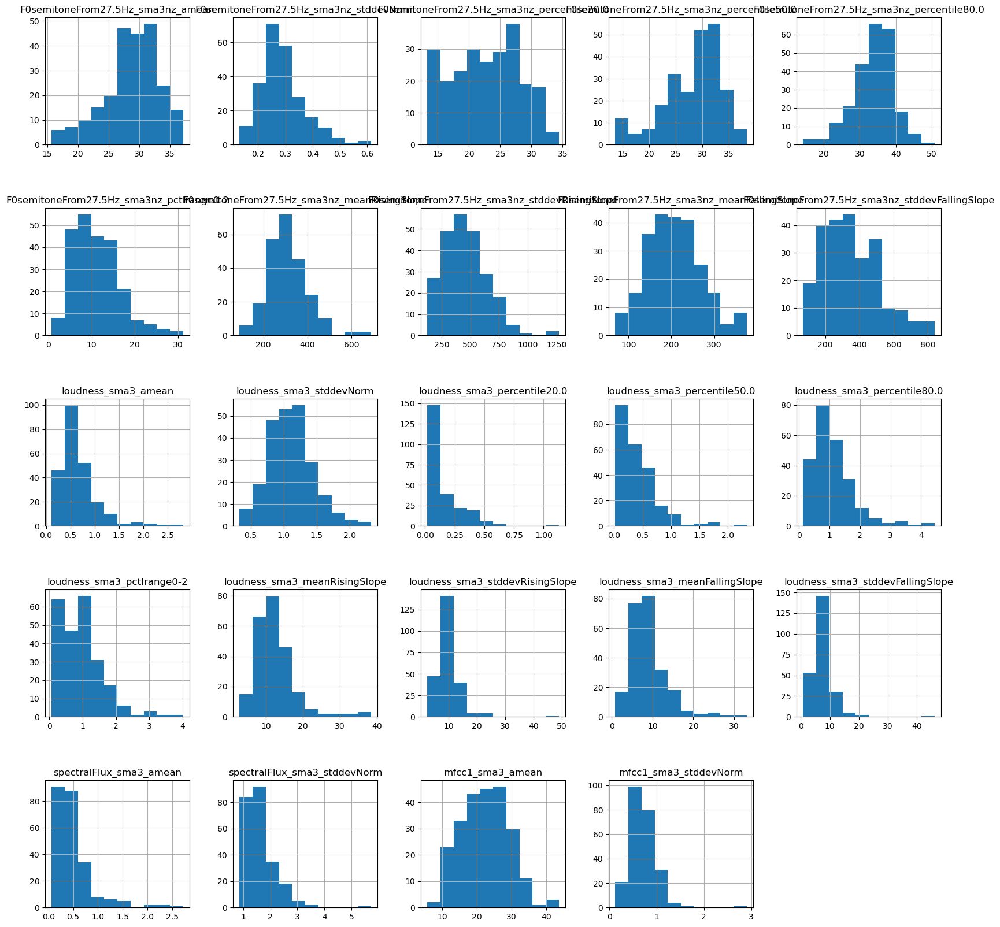

In [24]:
combined_data.iloc[:,:24].hist(figsize=(20,20))
plt.subplots_adjust(hspace=0.5);

Notice some features related to standard devations of certain metrics have outliers in the data distribution. For example, loudness_sma3_stdevRisingSlope. Should we concerned about those signficant outliers?

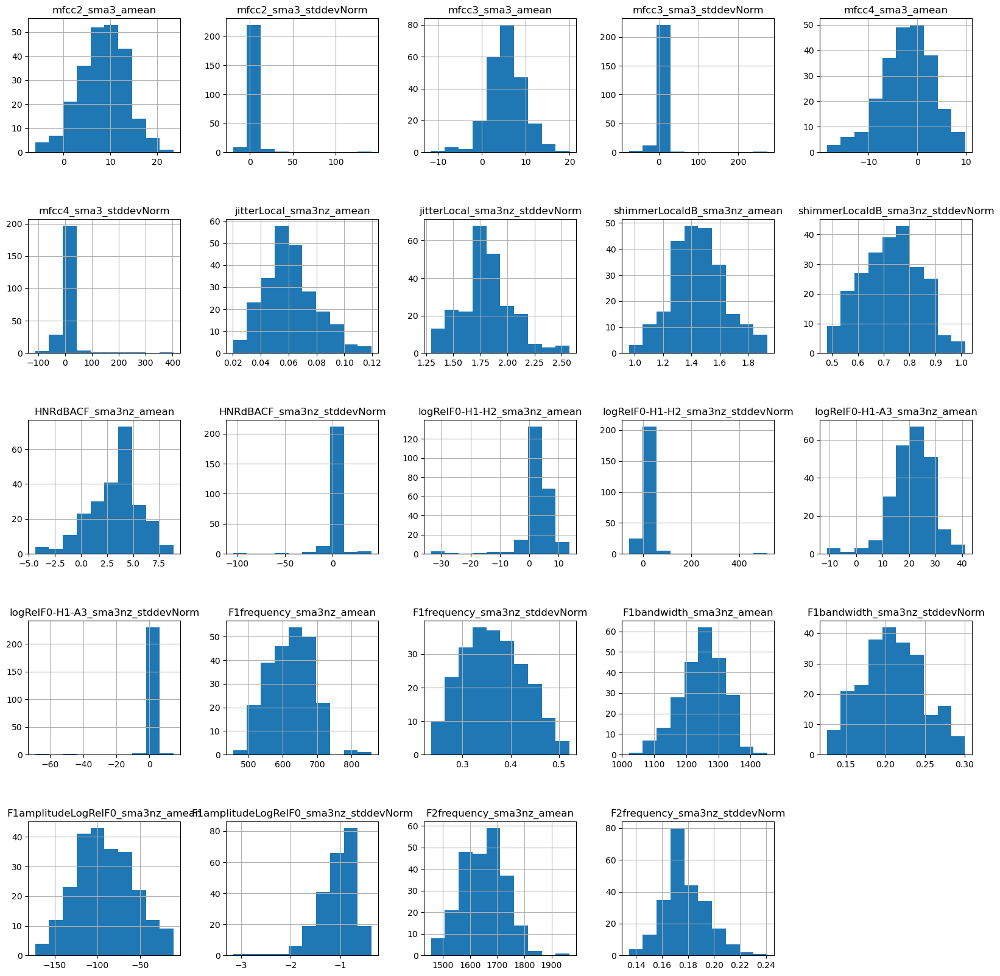

In [25]:
combined_data.iloc[:,24:48].hist(figsize=(20,20))
plt.subplots_adjust(hspace=0.5);

Notice mfcc3_sma3_stdev has large outliers. Most data are distributed around 0 while there's an outlier over 250.

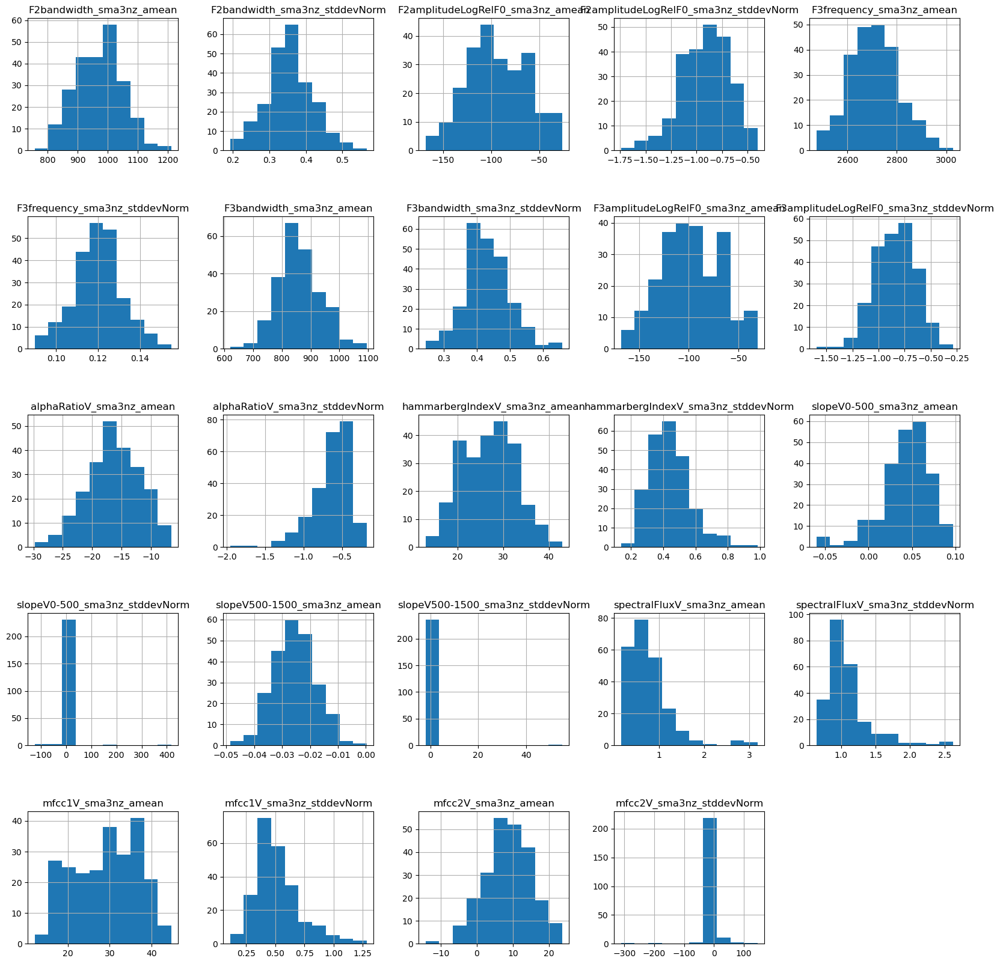

In [26]:
combined_data.iloc[:,48:72].hist(figsize=(20,20))
plt.subplots_adjust(hspace=0.5);

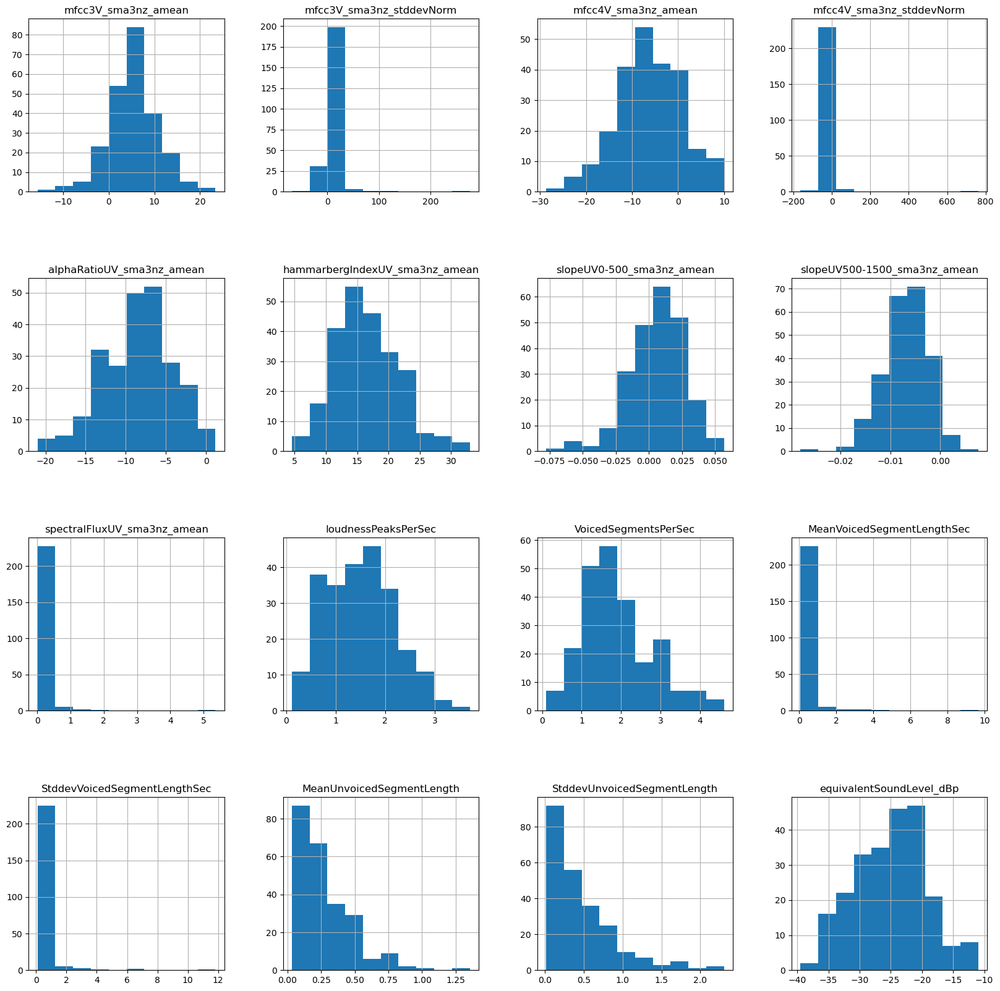

In [27]:
combined_data.iloc[:,72:90].hist(figsize=(20,20))
plt.subplots_adjust(hspace=0.5);

Overall, some features have very large outliers. Will there be an effect of these outliers on our work? Is this something we should be careful about?

### Principle Component Analysis

In [28]:
combined_data_scale = scale(combined_data.iloc[:,:-1])

In [29]:
ad_pca = PCA().fit(combined_data_scale)

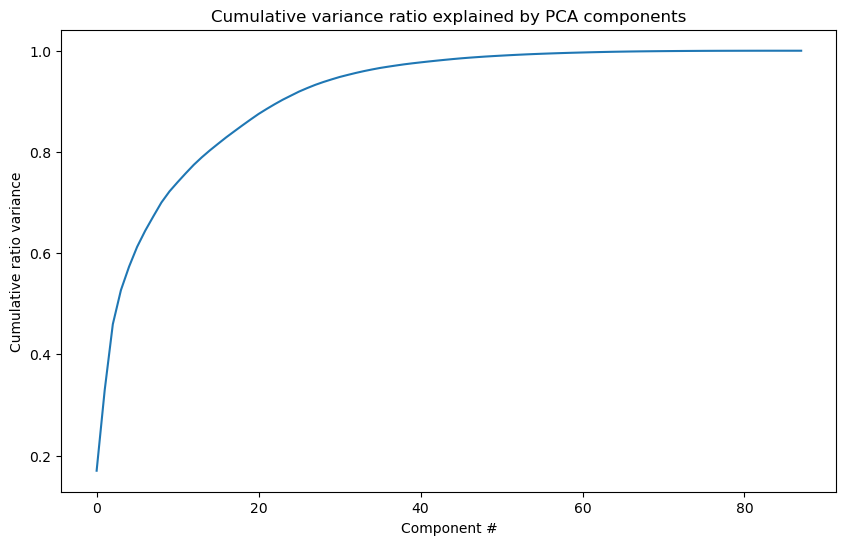

In [30]:
plt.subplots(figsize=(10, 6))
plt.plot(ad_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
#plt.xticks(np.arange(0,100,1))
plt.title('Cumulative variance ratio explained by PCA components');

In [31]:
ad_pca.explained_variance_ratio_.cumsum()

array([0.17008573, 0.32983654, 0.459592  , 0.52691584, 0.57307921,
       0.61245781, 0.6443556 , 0.67263812, 0.70011008, 0.72210057,
       0.74028594, 0.75777093, 0.77462606, 0.78957271, 0.80331666,
       0.81619157, 0.82886709, 0.84074591, 0.85248493, 0.86394537,
       0.87506752, 0.88498461, 0.89444256, 0.9033418 , 0.91134397,
       0.91930833, 0.92616234, 0.93258226, 0.9381858 , 0.94325974,
       0.9480647 , 0.95216462, 0.95609434, 0.95970149, 0.9629394 ,
       0.96596182, 0.9684837 , 0.97087157, 0.97315979, 0.97513634,
       0.97696596, 0.97873647, 0.9804064 , 0.98200828, 0.98354161,
       0.98496893, 0.98622895, 0.98737723, 0.98846837, 0.98941548,
       0.99031441, 0.99118664, 0.99198794, 0.99273272, 0.99341093,
       0.99402898, 0.99459876, 0.99513932, 0.99563987, 0.99609614,
       0.99652354, 0.9969299 , 0.9973135 , 0.99765645, 0.99797557,
       0.99823552, 0.99848729, 0.99870365, 0.99888752, 0.99905103,
       0.99919775, 0.99933484, 0.99945199, 0.99955656, 0.99964

Notice we need about 9 principle componenets to capture 70% of variance. I guess this suggests PCA is not a good option here for feature selection.

#### Let's look at correlation between the features to see if there's multicolinearity.

In [32]:
combined_data.corr()

C:\Users\Nadun\AppData\Local\Temp\ipykernel_37748\245875828.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  combined_data.corr()


,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_stddevNorm,F0semitoneFrom27.5Hz_sma3nz_percentile20.0,F0semitoneFrom27.5Hz_sma3nz_percentile50.0,F0semitoneFrom27.5Hz_sma3nz_percentile80.0,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope,...,slopeUV0-500_sma3nz_amean,slopeUV500-1500_sma3nz_amean,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,VoicedSegmentsPerSec,MeanVoicedSegmentLengthSec,StddevVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,StddevUnvoicedSegmentLength,equivalentSoundLevel_dBp
F0semitoneFrom27.5Hz_sma3nz_amean,1.000000,-0.558676,0.855029,0.926581,0.831971,-0.019712,0.322056,0.271368,0.382217,0.332225,...,0.298312,0.232665,-0.343513,0.251763,-0.193119,-0.354599,-0.390945,0.359017,0.322277,0.104856
F0semitoneFrom27.5Hz_sma3nz_stddevNorm,-0.558676,1.000000,-0.758605,-0.661006,-0.183810,0.582576,0.142991,0.150054,0.078061,-0.073711,...,-0.248138,-0.067490,0.367054,-0.386509,0.275449,0.215865,0.249783,-0.329365,-0.301555,-0.175501
F0semitoneFrom27.5Hz_sma3nz_percentile20.0,0.855029,-0.758605,1.000000,0.766713,0.516748,-0.488186,0.159012,0.157438,0.200584,0.265821,...,0.215475,0.225731,-0.274290,0.365436,-0.367457,-0.208099,-0.255041,0.399932,0.369820,0.174123
F0semitoneFrom27.5Hz_sma3nz_percentile50.0,0.926581,-0.661006,0.766713,1.000000,0.718869,-0.045370,0.233935,0.137918,0.305083,0.258185,...,0.307002,0.117316,-0.356352,0.271551,-0.097944,-0.371712,-0.402931,0.266213,0.227942,0.118801
F0semitoneFrom27.5Hz_sma3nz_percentile80.0,0.831971,-0.183810,0.516748,0.718869,1.000000,0.494916,0.331319,0.275426,0.371368,0.269326,...,0.238385,0.171442,-0.314222,0.070401,-0.026903,-0.350668,-0.354560,0.242980,0.207105,0.026315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MeanVoicedSegmentLengthSec,-0.354599,0.215865,-0.208099,-0.371712,-0.350668,-0.146257,-0.296753,-0.240384,-0.286259,-0.177320,...,-0.296458,-0.225166,0.518082,-0.060701,-0.398670,1.000000,0.964346,-0.125884,-0.111038,0.047641
StddevVoicedSegmentLengthSec,-0.390945,0.249783,-0.255041,-0.402931,-0.354560,-0.102580,-0.304487,-0.255847,-0.287035,-0.191509,...,-0.288904,-0.211267,0.469612,-0.091305,-0.375565,0.964346,1.000000,-0.166290,-0.151729,0.028104
MeanUnvoicedSegmentLength,0.359017,-0.329365,0.399932,0.266213,0.242980,-0.158222,0.023885,0.064189,0.147828,0.272250,...,-0.213640,0.316424,-0.290396,-0.263132,-0.581650,-0.125884,-0.166290,1.000000,0.968491,-0.205166
StddevUnvoicedSegmentLength,0.322277,-0.301555,0.369820,0.227942,0.207105,-0.164229,0.014535,0.061749,0.165268,0.274108,...,-0.200292,0.296380,-0.275168,-0.240430,-0.577790,-0.111038,-0.151729,0.968491,1.000000,-0.185681


Text(0.5, 1.0, 'Heat map of correlation between first 10 features')

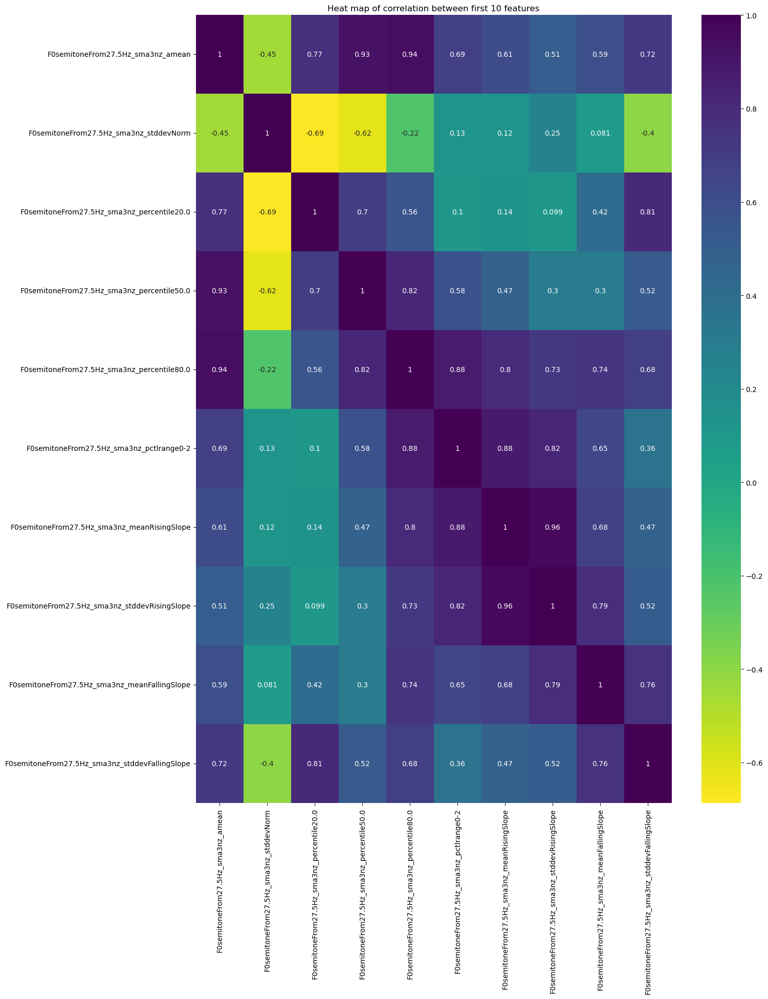

In [33]:
#
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data.iloc[:10,:10].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between first 10 features')

### It looks like several summary statistics are correlated. For instance mean and the 50% percentile. Data are somewhat normally distributed so this makes sense. Therefore, we could drop 20,50 and 80 perecntile features and keep the mean. Rising and falling mean slope data are also correlated with their standard deviations so we could also keep the mean Rising/falling slope.

Text(0.5, 1.0, 'Heat map of correlation between next 10 features')

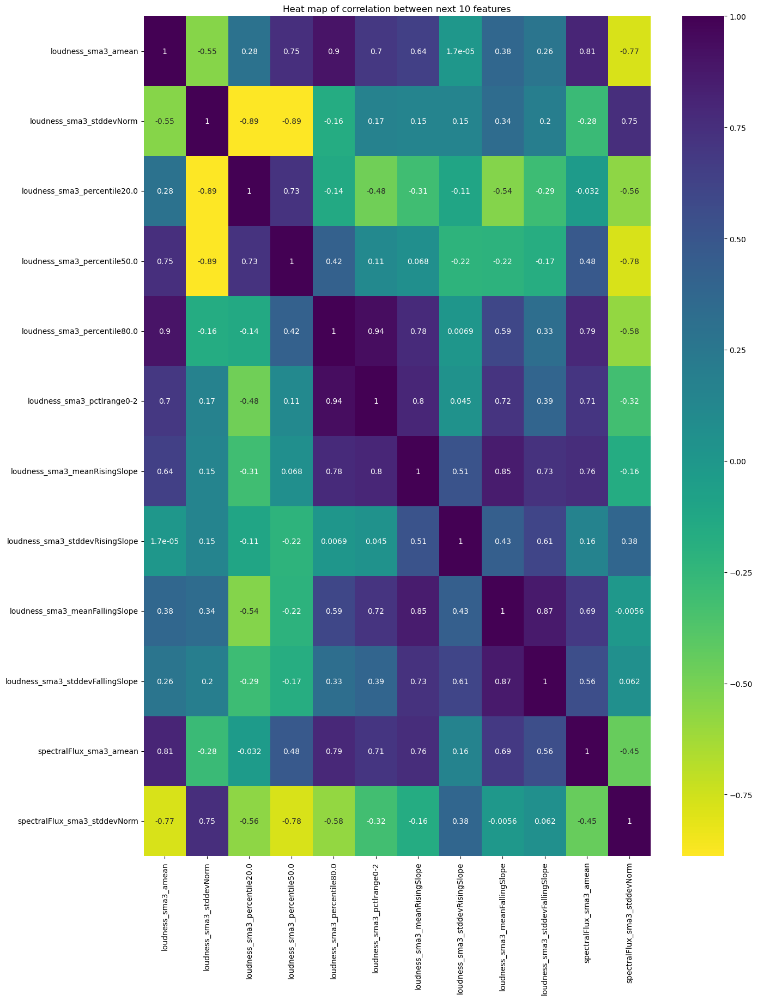

In [34]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data.iloc[10:22,10:22].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between next 10 features')

### The same conclusion can be made about the loudness feature set. It looks like we have many features that we can drop.

In [35]:
combined_data.columns

Index(['F0semitoneFrom27.5Hz_sma3nz_amean',
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm',
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope', 'loudness_sma3_amean',
       'loudness_sma3_stddevNorm', 'loudness_sma3_percentile20.0',
       'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0',
       'loudness_sma3_pctlrange0-2', 'loudness_sma3_meanRisingSlope',
       'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
       'loudness_sma3_stddevFallingSlope', 'spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm', 'mfcc1_sma3_amean',
       'mfcc1_sma3_stddevNorm', 'mfcc2_

#### Looks like there are "chunks" of data. That is, look at the first 10 feature set. They are related to F0semitone. The first 10
#### features are just mean, std, perecentiles of F0semitone. Can investigate each chunk for correlations using heatmaps and pairplots.

In [91]:
#features "chunk" collections

F0_feature_set = ['F0semitoneFrom27.5Hz_sma3nz_amean',
       'F0semitoneFrom27.5Hz_sma3nz_stddevNorm',
       'F0semitoneFrom27.5Hz_sma3nz_percentile20.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile50.0',
       'F0semitoneFrom27.5Hz_sma3nz_percentile80.0',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevRisingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope',
       'F0semitoneFrom27.5Hz_sma3nz_stddevFallingSlope','status']


loudness_feature_set = ['loudness_sma3_amean',
       'loudness_sma3_stddevNorm', 'loudness_sma3_percentile20.0',
       'loudness_sma3_percentile50.0', 'loudness_sma3_percentile80.0',
       'loudness_sma3_pctlrange0-2', 'loudness_sma3_meanRisingSlope',
       'loudness_sma3_stddevRisingSlope', 'loudness_sma3_meanFallingSlope',
       'loudness_sma3_stddevFallingSlope','status']

spectral_flux_feature_set = ['spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm','status']

mfcc_feature_set = ['mfcc1_sma3_amean',
       'mfcc1_sma3_stddevNorm', 'mfcc2_sma3_amean', 'mfcc2_sma3_stddevNorm',
       'mfcc3_sma3_amean', 'mfcc3_sma3_stddevNorm', 'mfcc4_sma3_amean',
       'mfcc4_sma3_stddevNorm','mfcc1V_sma3nz_amean',
       'mfcc1V_sma3nz_stddevNorm','mfcc2V_sma3nz_amean',
       'mfcc2V_sma3nz_stddevNorm','mfcc3V_sma3nz_amean',
       'mfcc3V_sma3nz_stddevNorm', 'mfcc4V_sma3nz_amean',
       'mfcc4V_sma3nz_stddevNorm','status']

jitter_shimmer_feature_set = ['jitterLocal_sma3nz_amean',
       'jitterLocal_sma3nz_stddevNorm', 'shimmerLocaldB_sma3nz_amean',
       'shimmerLocaldB_sma3nz_stddevNorm','status']

log_rel_feature_set = ['HNRdBACF_sma3nz_amean',
       'HNRdBACF_sma3nz_stddevNorm', 'logRelF0-H1-H2_sma3nz_amean',
       'logRelF0-H1-H2_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean',
       'logRelF0-H1-A3_sma3nz_stddevNorm','status']

F1_feature_set = ['F1frequency_sma3nz_amean',
       'F1frequency_sma3nz_stddevNorm', 'F1bandwidth_sma3nz_amean',
       'F1bandwidth_sma3nz_stddevNorm', 'F1amplitudeLogRelF0_sma3nz_amean',
       'F1amplitudeLogRelF0_sma3nz_stddevNorm','status']

F2_feature_set = ['F2frequency_sma3nz_amean',
       'F2frequency_sma3nz_stddevNorm', 'F2bandwidth_sma3nz_amean',
       'F2bandwidth_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean',
       'F2amplitudeLogRelF0_sma3nz_stddevNorm','status']

F3_feature_set = ['F3frequency_sma3nz_amean',
       'F3frequency_sma3nz_stddevNorm', 'F3bandwidth_sma3nz_amean',
       'F3bandwidth_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_amean',
       'F3amplitudeLogRelF0_sma3nz_stddevNorm','status']

slope_alphaV_feature_set = ['alphaRatioV_sma3nz_amean',
       'alphaRatioV_sma3nz_stddevNorm', 'hammarbergIndexV_sma3nz_amean',
       'hammarbergIndexV_sma3nz_stddevNorm', 'slopeV0-500_sma3nz_amean',
       'slopeV0-500_sma3nz_stddevNorm', 'slopeV500-1500_sma3nz_amean',
       'slopeV500-1500_sma3nz_stddevNorm','spectralFluxV_sma3nz_amean',
       'spectralFluxV_sma3nz_stddevNorm','status']

slope_alphaUV_feature_set = ['alphaRatioUV_sma3nz_amean',
       'hammarbergIndexUV_sma3nz_amean', 'slopeUV0-500_sma3nz_amean',
       'slopeUV500-1500_sma3nz_amean', 'spectralFluxUV_sma3nz_amean','status']


other_features_set = ['loudnessPeaksPerSec', 'VoicedSegmentsPerSec',
       'MeanVoicedSegmentLengthSec', 'StddevVoicedSegmentLengthSec',
       'MeanUnvoicedSegmentLength', 'StddevUnvoicedSegmentLength',
       'equivalentSoundLevel_dBp','status']



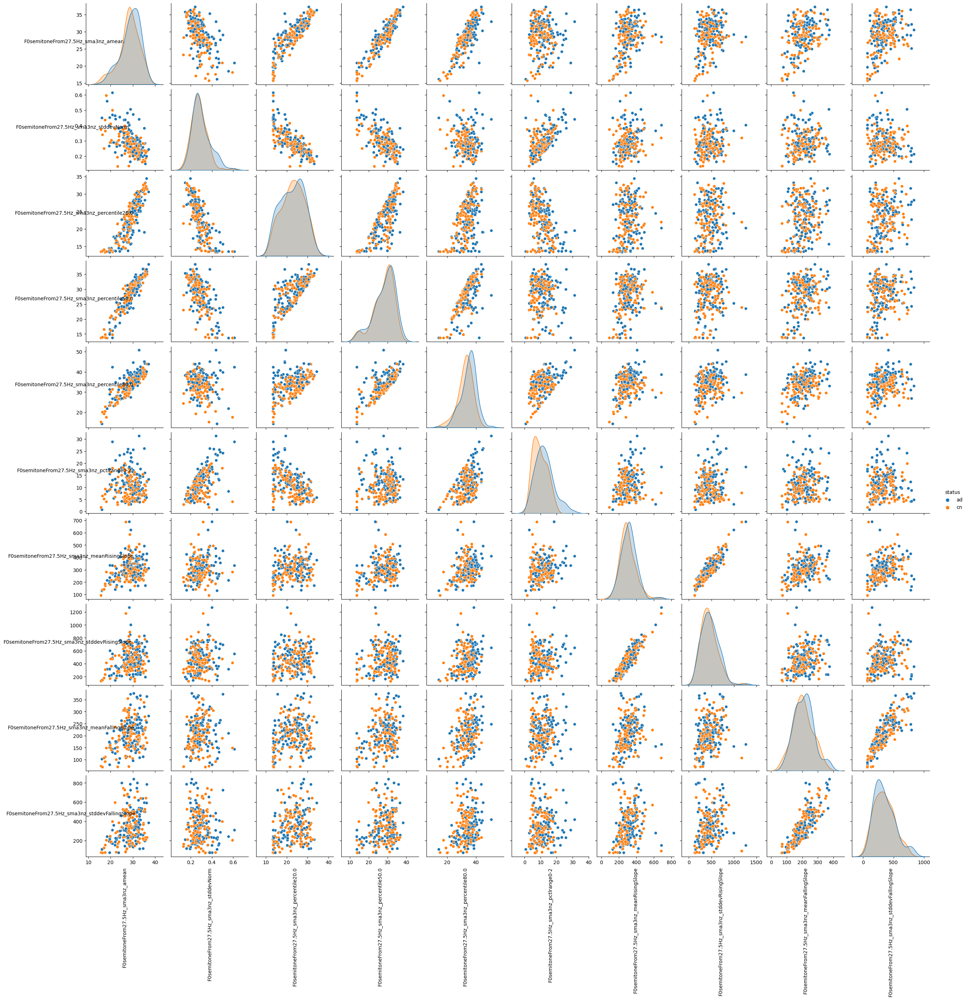

In [90]:
# First chunk pairplot and heatmap

g = sns.pairplot(combined_data[F0_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)
    


Text(0.5, 1.0, 'Heat map of correlation between F0semitone features')

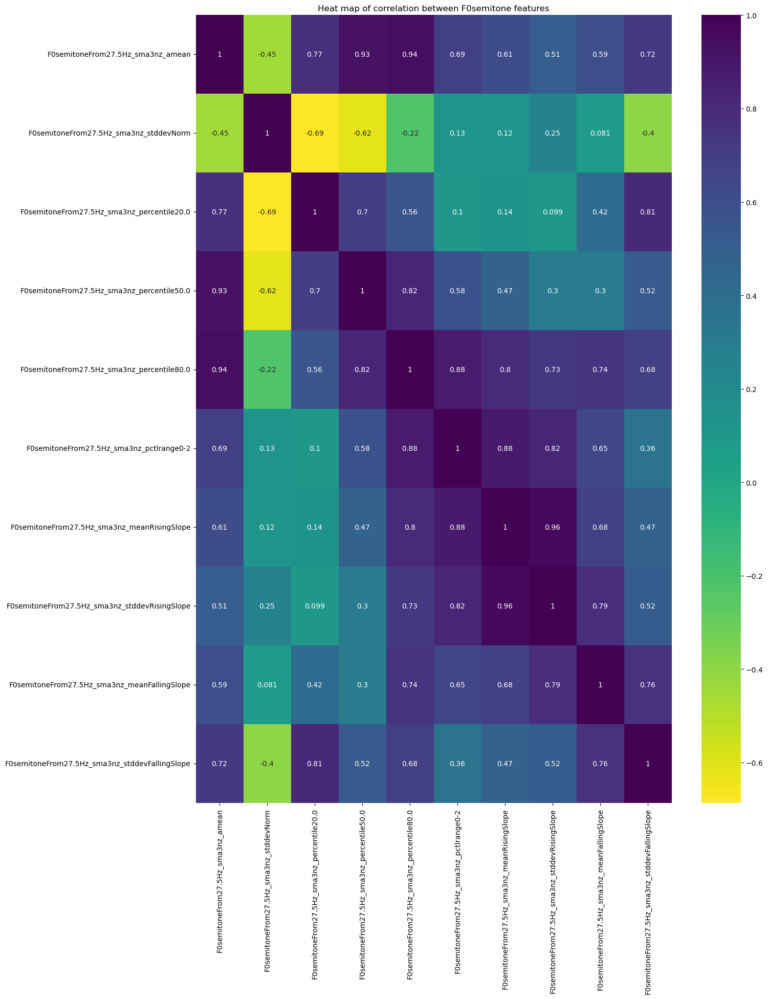

In [38]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data.iloc[:10,:10].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F0semitone features')

#### Summary - comparing pairplots and the heatmap

1. Looks like 'F0semitoneFrom27.5Hz_sma3nz_amean' is strongly correlated with it's three percentiles (20,50 and 80)
2.'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope' has a strong correlation with it's std feature - same for Falling Slope

Now the question is should we drop mean or std features? I dropped std features (no logic there to be honest)

Here's the new F0 feature set after drooping some:

In [92]:
# F0_new = ['F0semitoneFrom27.5Hz_sma3nz_amean',
#        'F0semitoneFrom27.5Hz_sma3nz_stddevNorm',
#        'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
#        'F0semitoneFrom27.5Hz_sma3nz_meanRisingSlope',
#        'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope']

F0_new = ['F0semitoneFrom27.5Hz_sma3nz_amean',
       'F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2',
       'F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope']

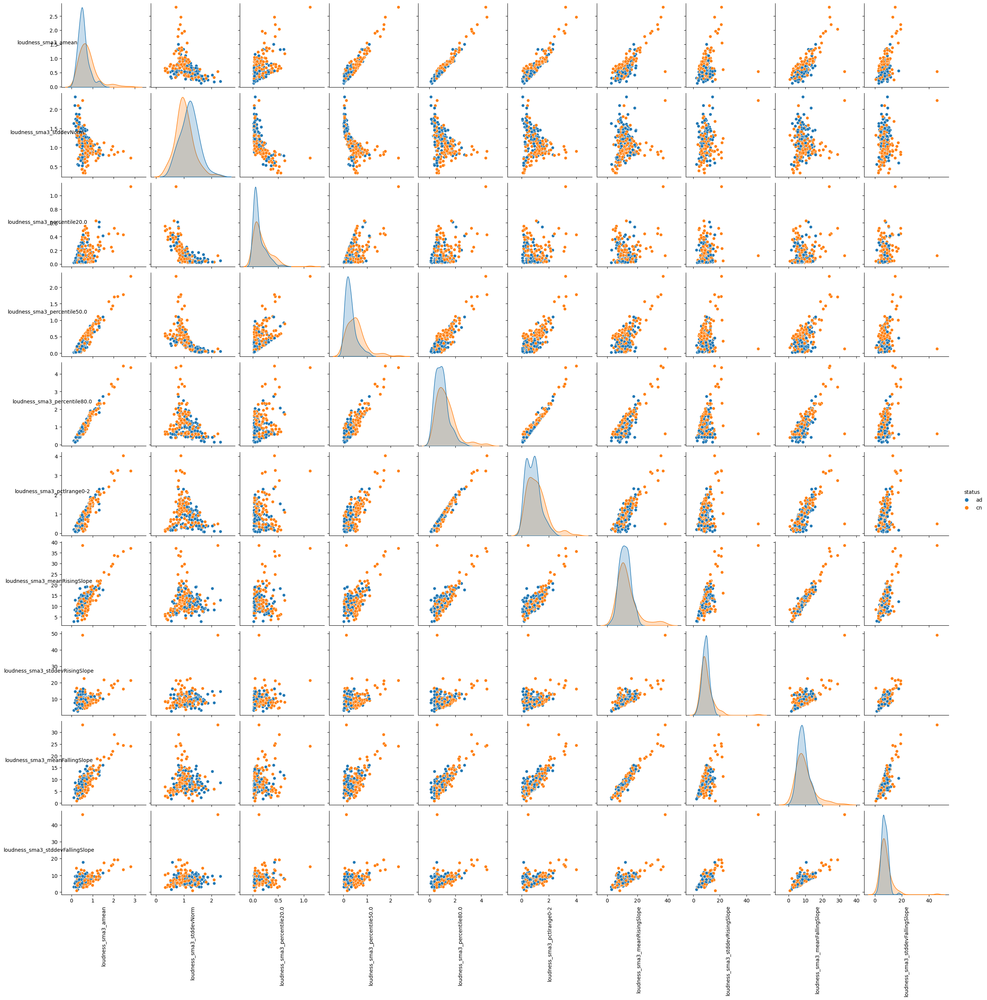

In [93]:
# Loudness feature set - pair plot and the heatmap

g = sns.pairplot(combined_data[loudness_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between loudness features')

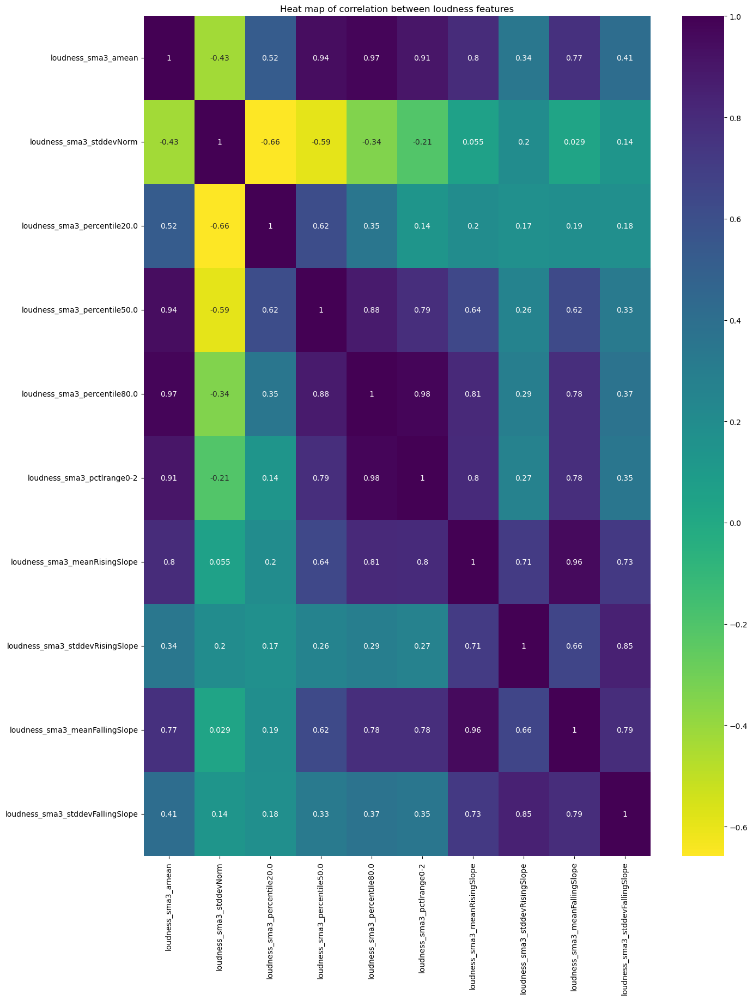

In [50]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[loudness_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between loudness features')

#### Summary - comparing pairplots and the heatmap

1. Looks like 'loudness_sma3_amean' is strongly correlated with it's three percentiles (20,50 and 80) and the range
2.'loudness_sma3_meanRisingSlope' has a strong correlation with falling slope and all std's


Here's the new loudness features I choose:



In [94]:
loudness_new = ['loudness_sma3_amean',
        'loudness_sma3_stddevNorm', 'loudness_sma3_stddevFallingSlope']

# loudness_new = ['loudness_sma3_pctlrange0-2',
#        'loudness_sma3_stddevNorm', 'loudness_sma3_meanRisingSlope']

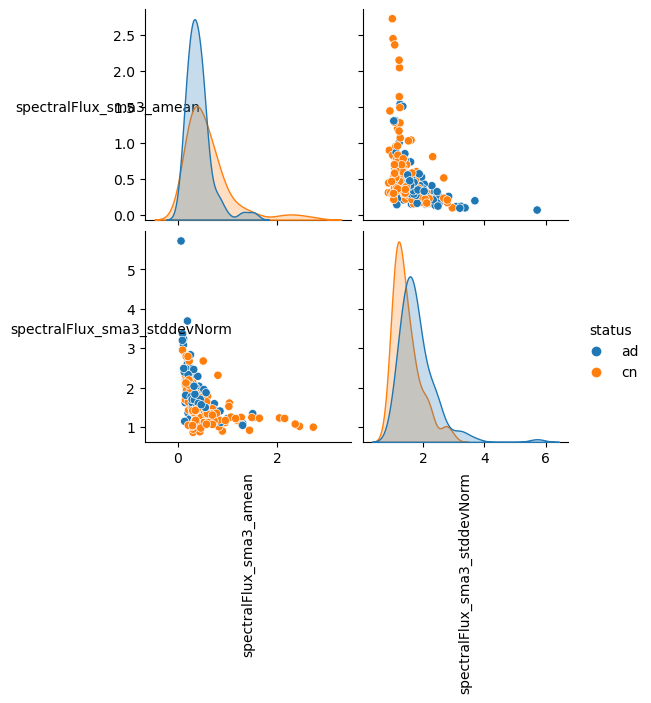

In [95]:
g = sns.pairplot(combined_data[spectral_flux_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

In [96]:
# Looks like we can keep both these features
spectral_flux_new = ['spectralFlux_sma3_amean',
       'spectralFlux_sma3_stddevNorm']

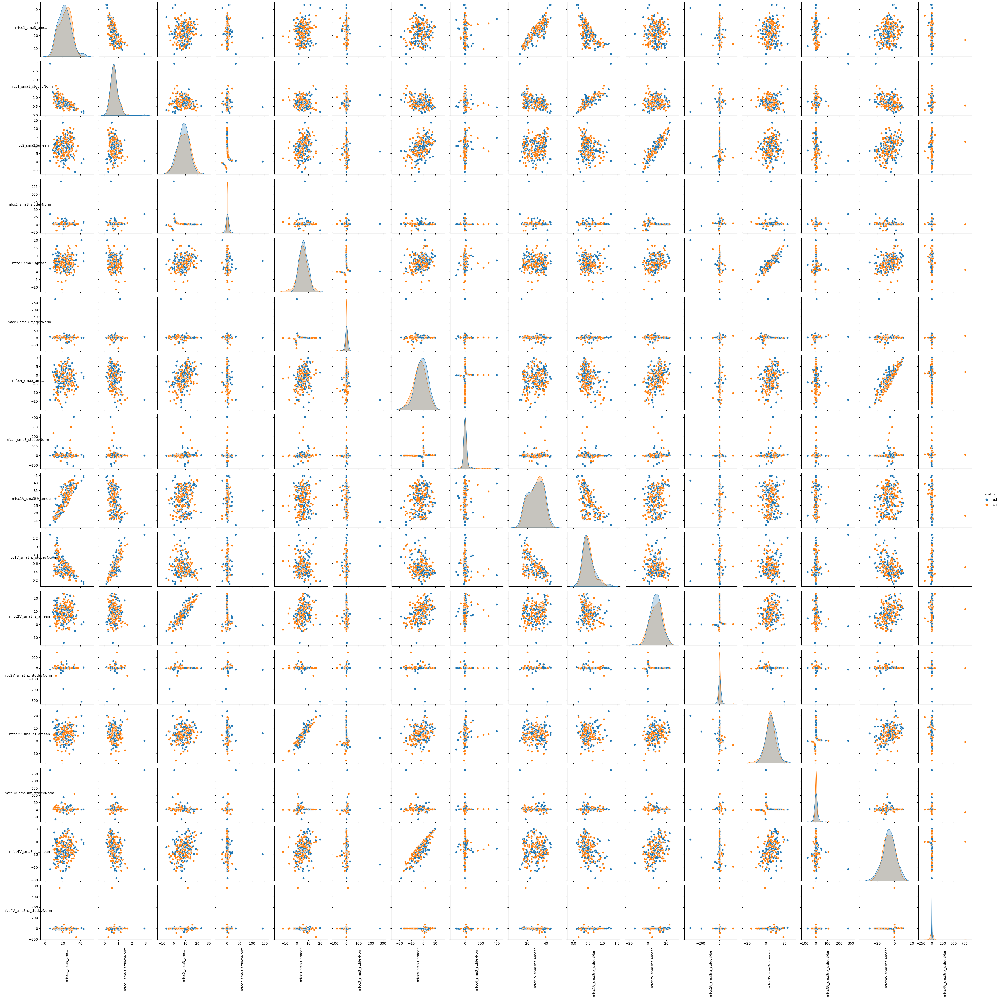

In [97]:
g = sns.pairplot(combined_data[mfcc_feature_set],hue='status')

for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between mfcc features')

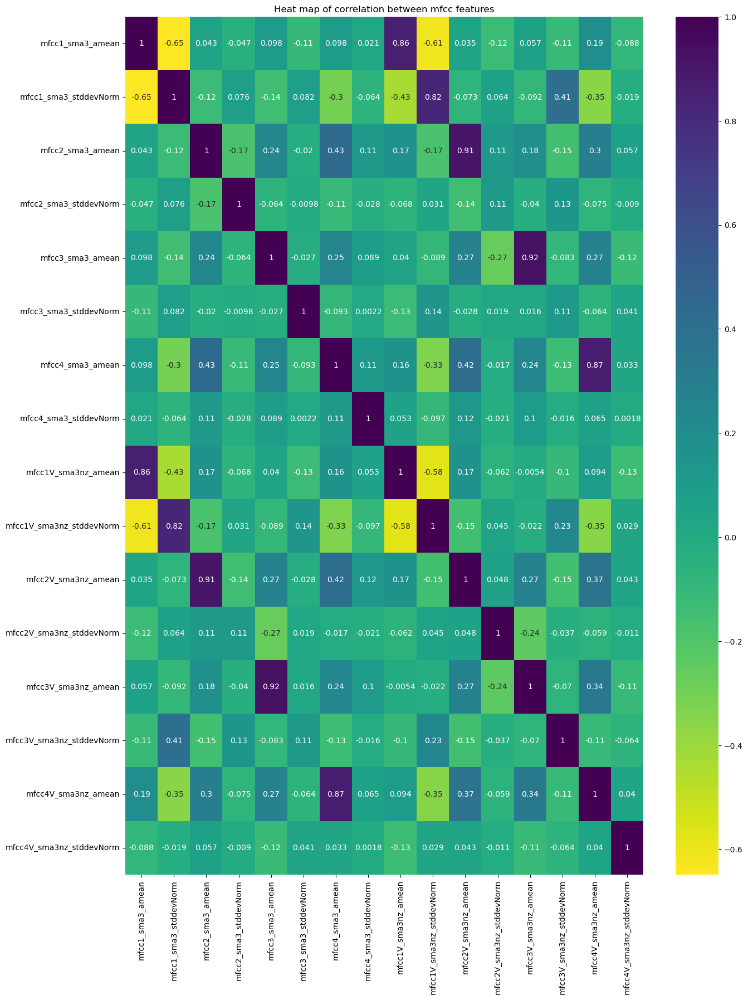

In [57]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[mfcc_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between mfcc features')

### Summary

Looks like 'mfcc1_sma3_amean' and 'mfcc1_sma3_stddevNorm' is highly correlated with 'mfcc1V_sma3nz_amean' and 'mfcc1V_sma3nz_stddevNorm'.
 Same observations can be made with mfcc2 (mean) and mfcc3/4 (mean).



In [98]:
mfcc_new = ['mfcc2_sma3_stddevNorm', 'mfcc3_sma3_stddevNorm','mfcc4_sma3_stddevNorm','mfcc2V_sma3nz_stddevNorm','mfcc3V_sma3nz_stddevNorm']



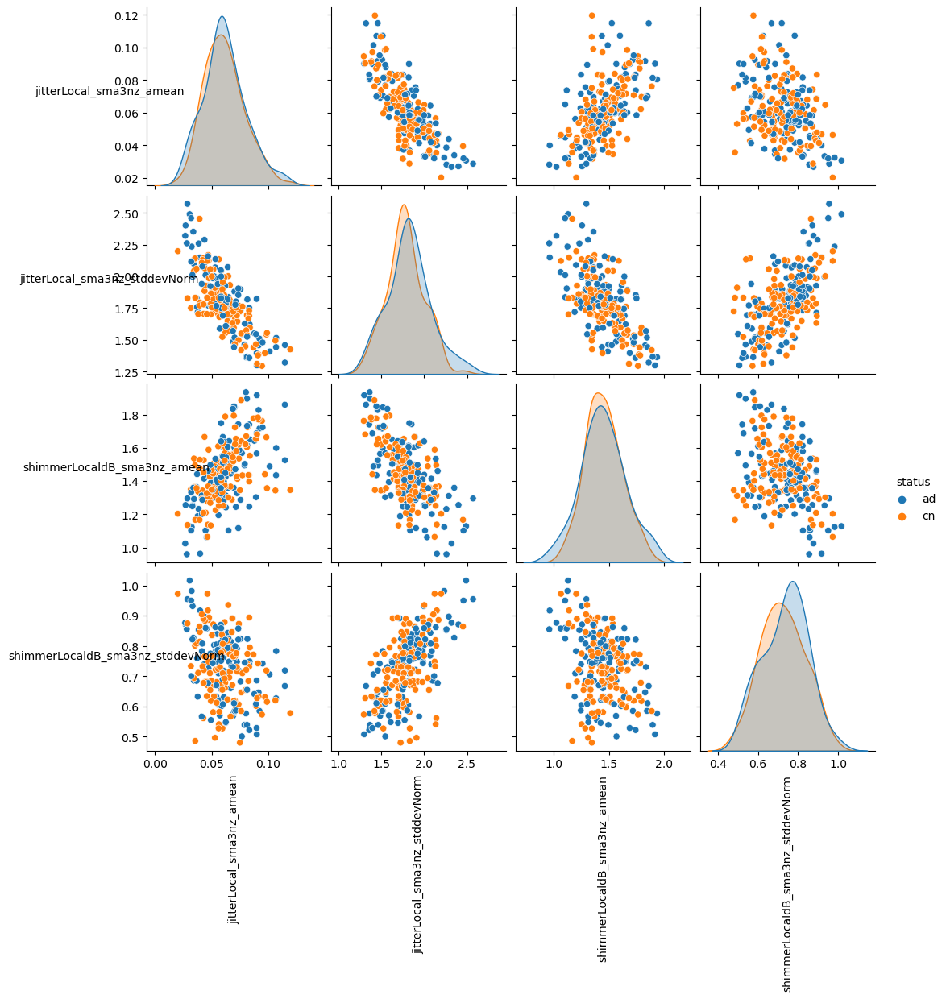

In [99]:
g = sns.pairplot(combined_data[jitter_shimmer_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between jitter-shimmer features')

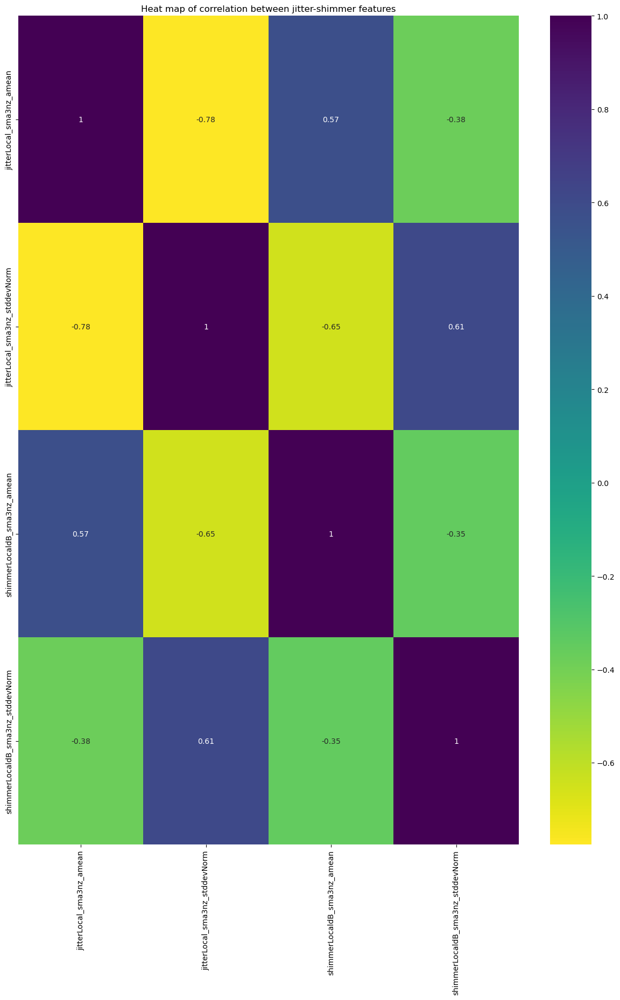

In [61]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[jitter_shimmer_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between jitter-shimmer features')

In [100]:
# One could argue for -0.78 correlation between 'jitterLocal_sma3nz_amean' and 'jitterLocal_sma3nz_stddevNorm'. 

jitter_new = ['jitterLocal_sma3nz_stddevNorm',
 'shimmerLocaldB_sma3nz_amean',
       'shimmerLocaldB_sma3nz_stddevNorm']




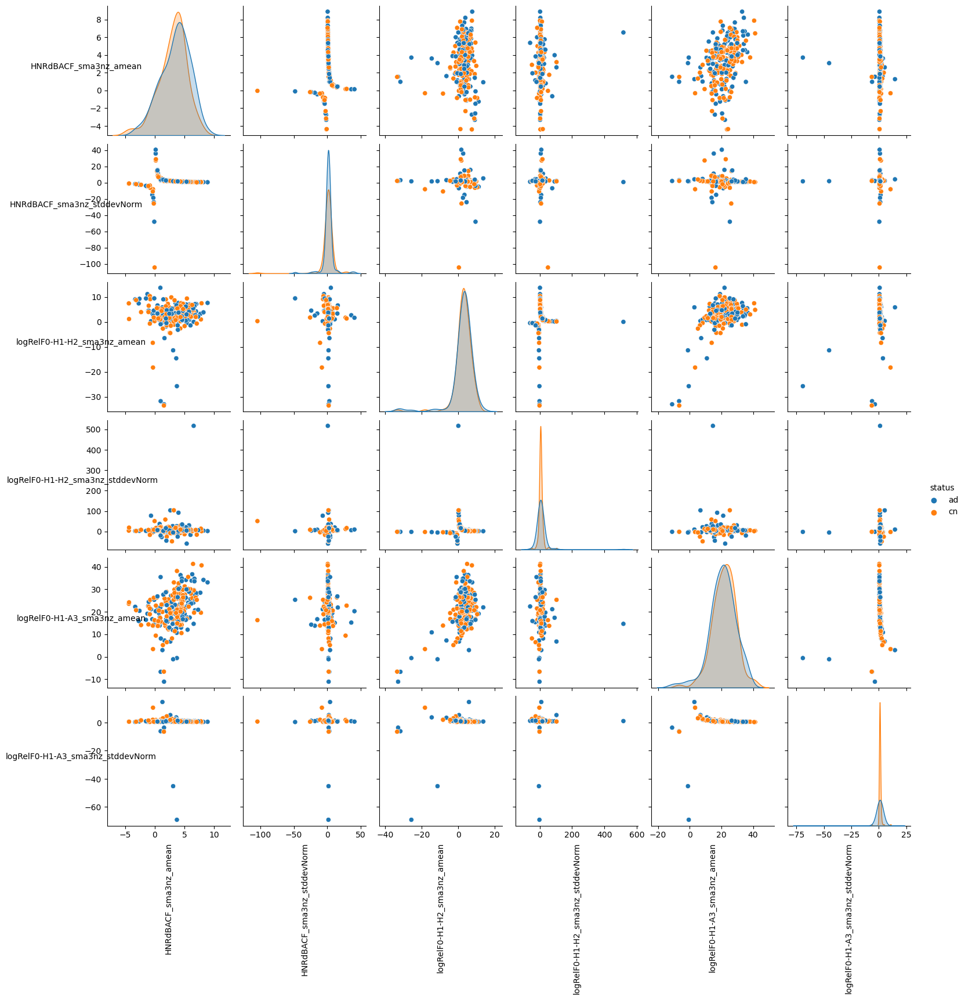

In [101]:
g = sns.pairplot(combined_data[log_rel_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between log-rel features')

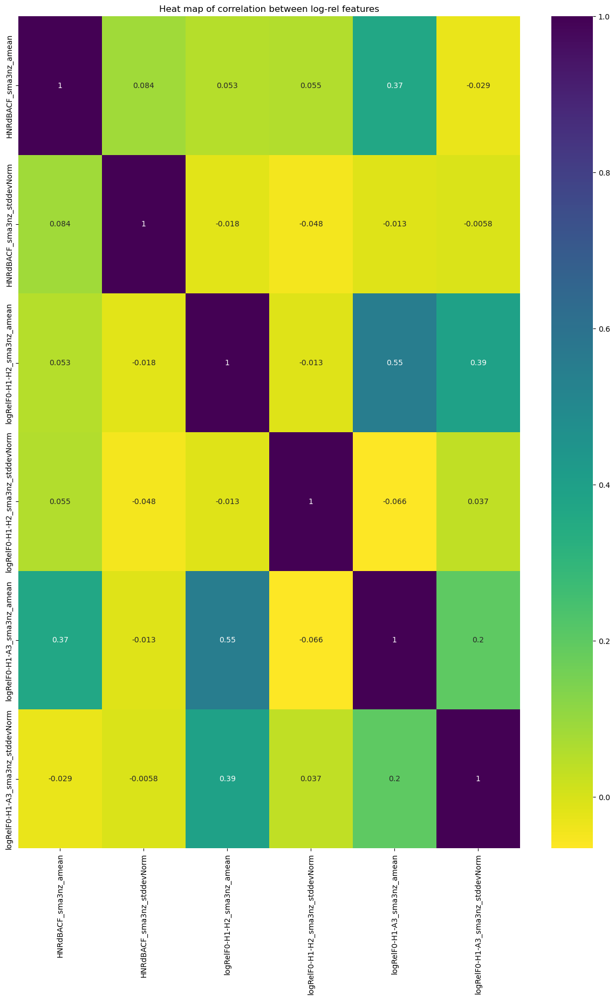

In [65]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[log_rel_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between log-rel features')

In [102]:
# Looks like a pretty independent set - so decided to keep all:

log_rel_new = ['HNRdBACF_sma3nz_amean',
       'HNRdBACF_sma3nz_stddevNorm', 'logRelF0-H1-H2_sma3nz_stddevNorm', 'logRelF0-H1-A3_sma3nz_amean',
       'logRelF0-H1-A3_sma3nz_stddevNorm']


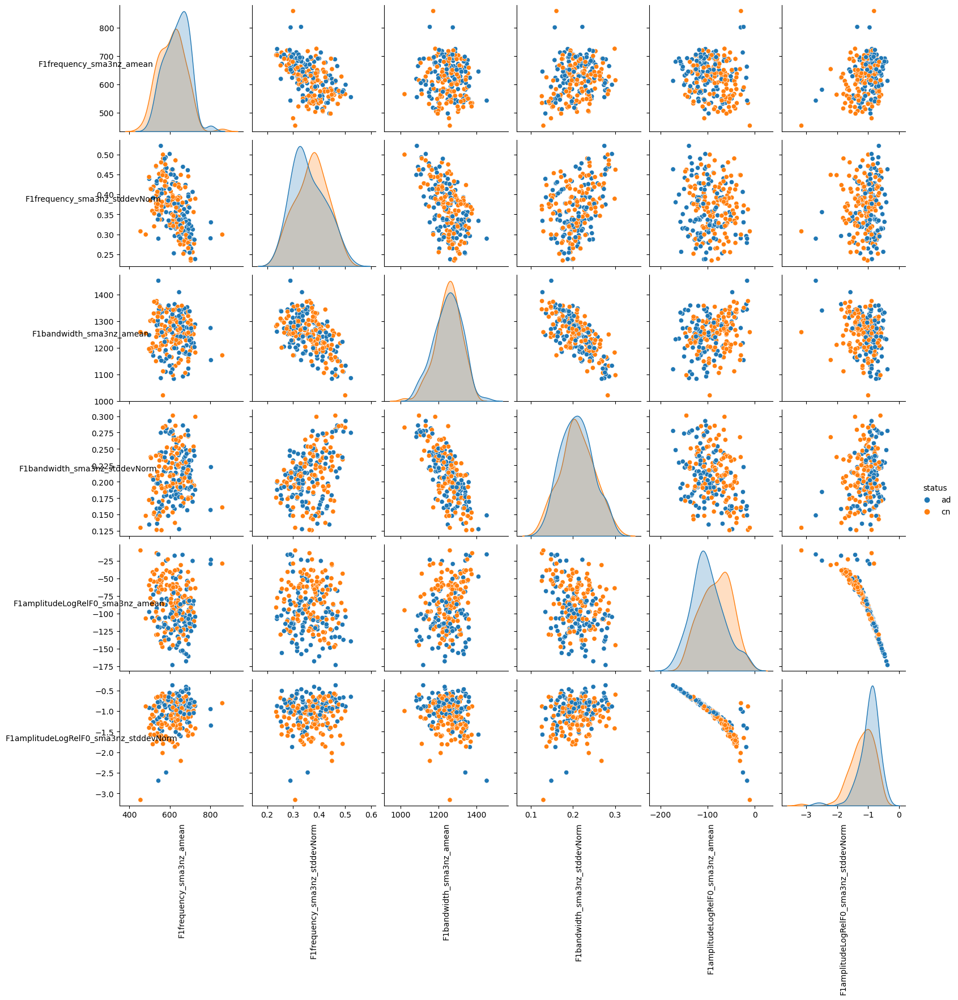

In [103]:
g = sns.pairplot(combined_data[F1_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between F1 features')

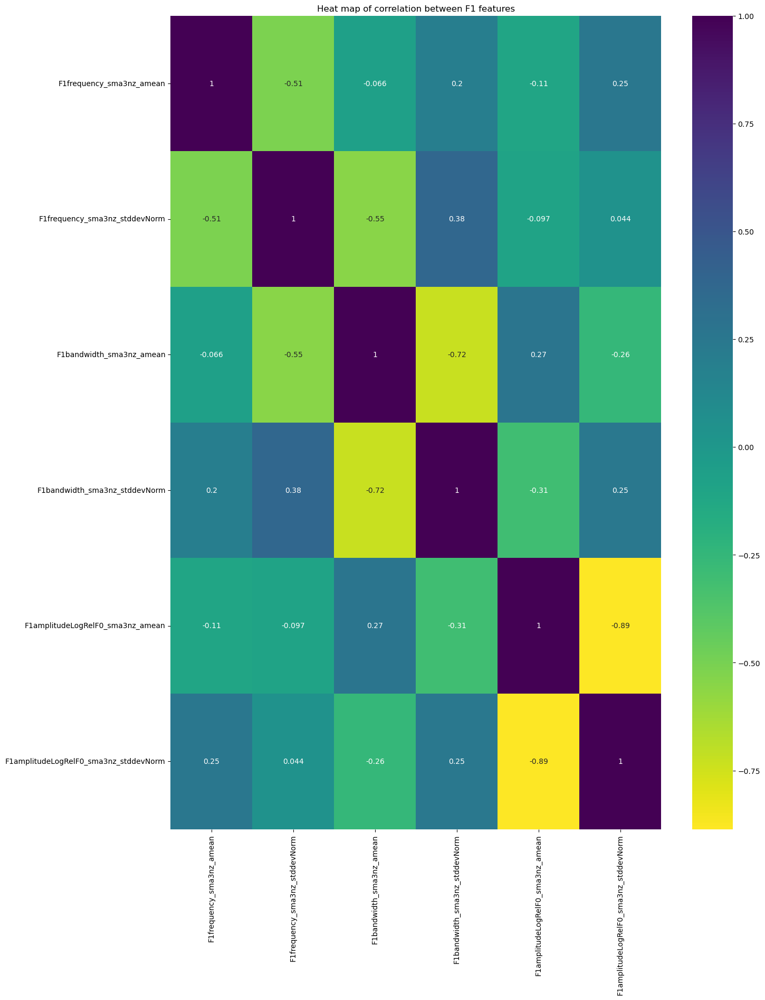

In [69]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F1_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F1 features')

In [104]:
# F1 amplitude mean and std are negatively correlated -0.88 so decided to drop std

F1_new = ['F1frequency_sma3nz_amean',
       'F1frequency_sma3nz_stddevNorm', 'F1amplitudeLogRelF0_sma3nz_amean']



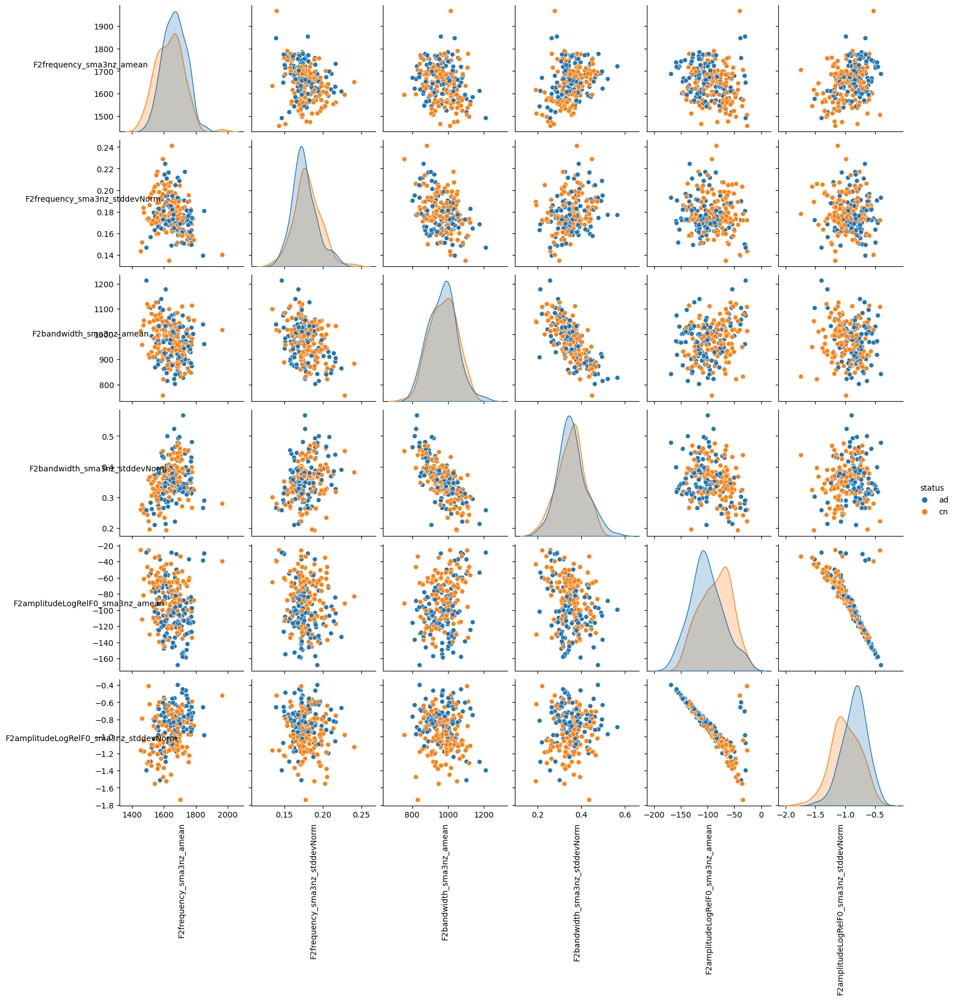

In [105]:
g = sns.pairplot(combined_data[F2_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between F2 features')

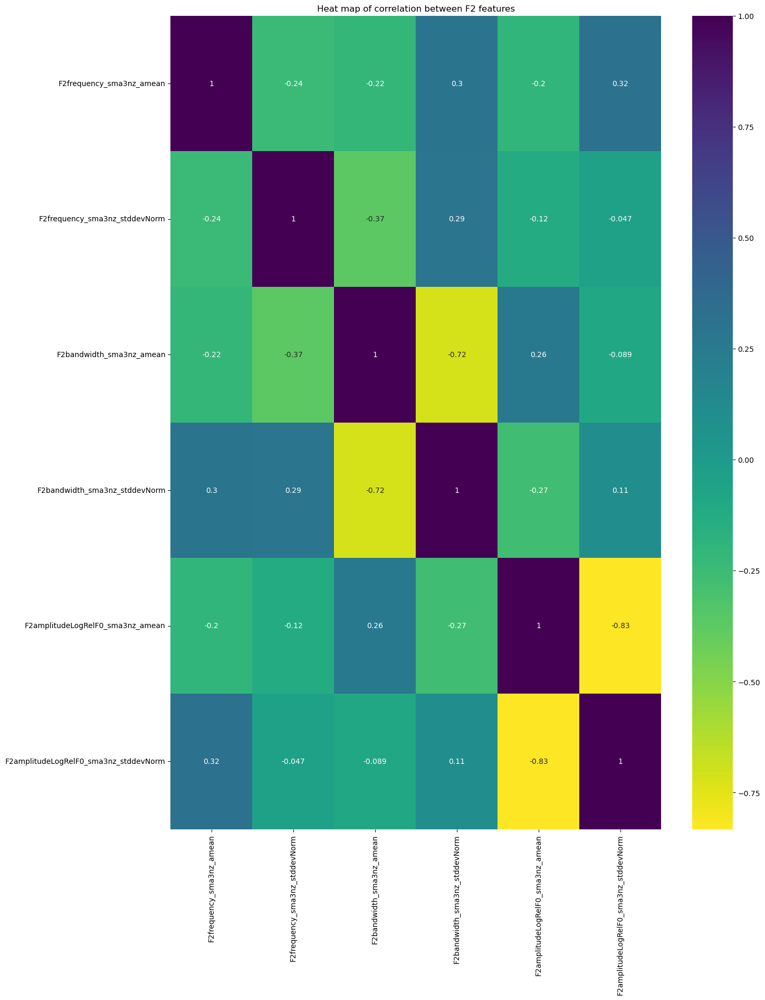

In [73]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F2_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F2 features')

In [106]:
# F2 amplitude mean and std are negatively correlated -0.88 so decided to drop std

# F2_new = ['F2frequency_sma3nz_amean',
#        'F2frequency_sma3nz_stddevNorm', 'F2bandwidth_sma3nz_amean',
#        'F2bandwidth_sma3nz_stddevNorm', 'F2amplitudeLogRelF0_sma3nz_amean']

F2_new = ['F2amplitudeLogRelF0_sma3nz_stddevNorm']

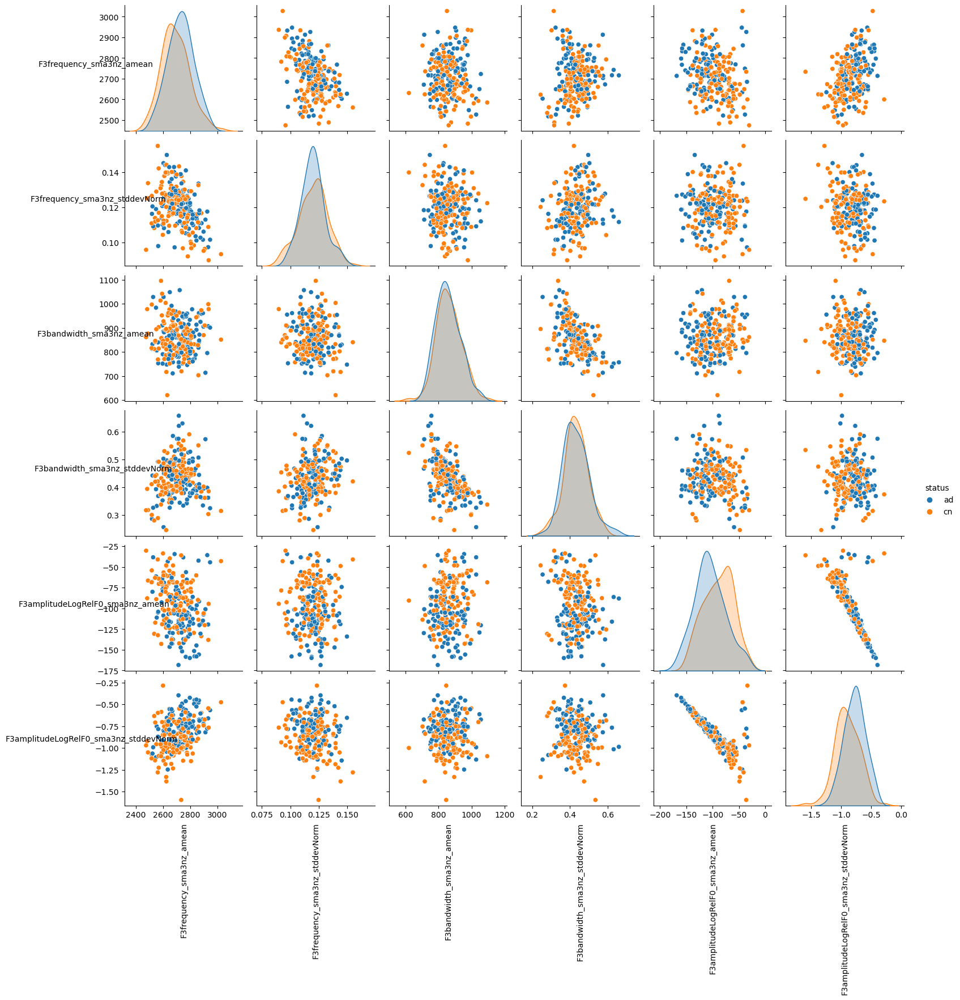

In [107]:
g = sns.pairplot(combined_data[F3_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

Text(0.5, 1.0, 'Heat map of correlation between F3 features')

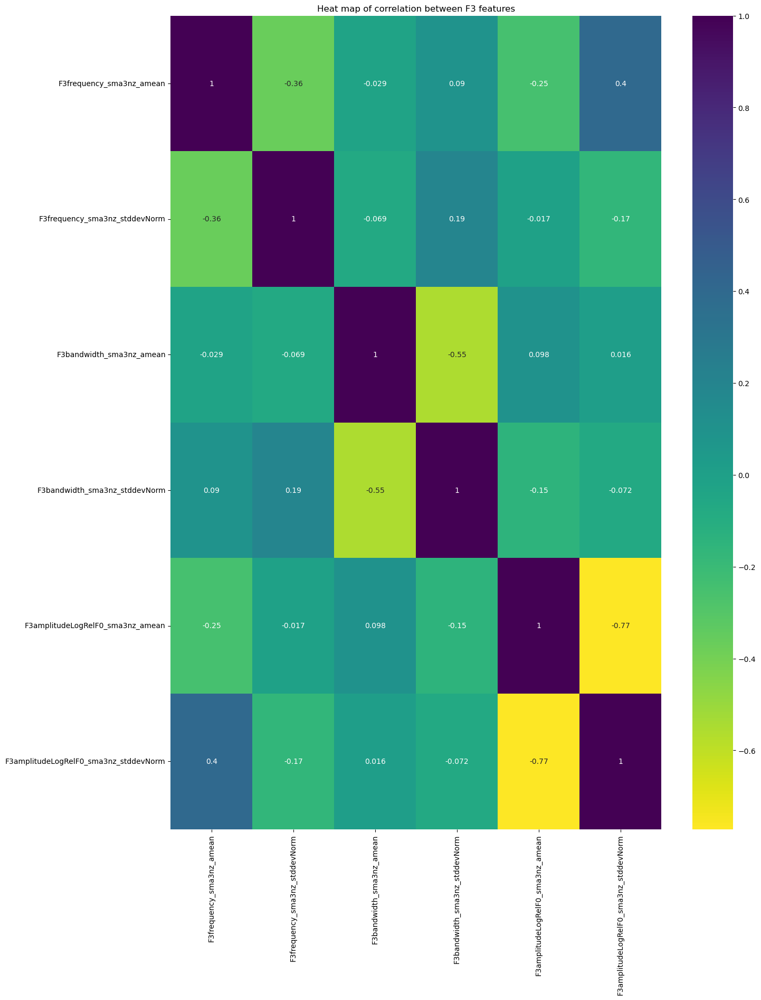

In [78]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[F3_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between F3 features')

In [108]:
# F3_new = ['F3frequency_sma3nz_amean',
#        'F3frequency_sma3nz_stddevNorm', 'F3bandwidth_sma3nz_amean',
#        'F3bandwidth_sma3nz_stddevNorm', 'F3amplitudeLogRelF0_sma3nz_stddevNorm']

F3_new = ['F3frequency_sma3nz_amean',
       'F3frequency_sma3nz_stddevNorm','F3amplitudeLogRelF0_sma3nz_stddevNorm']

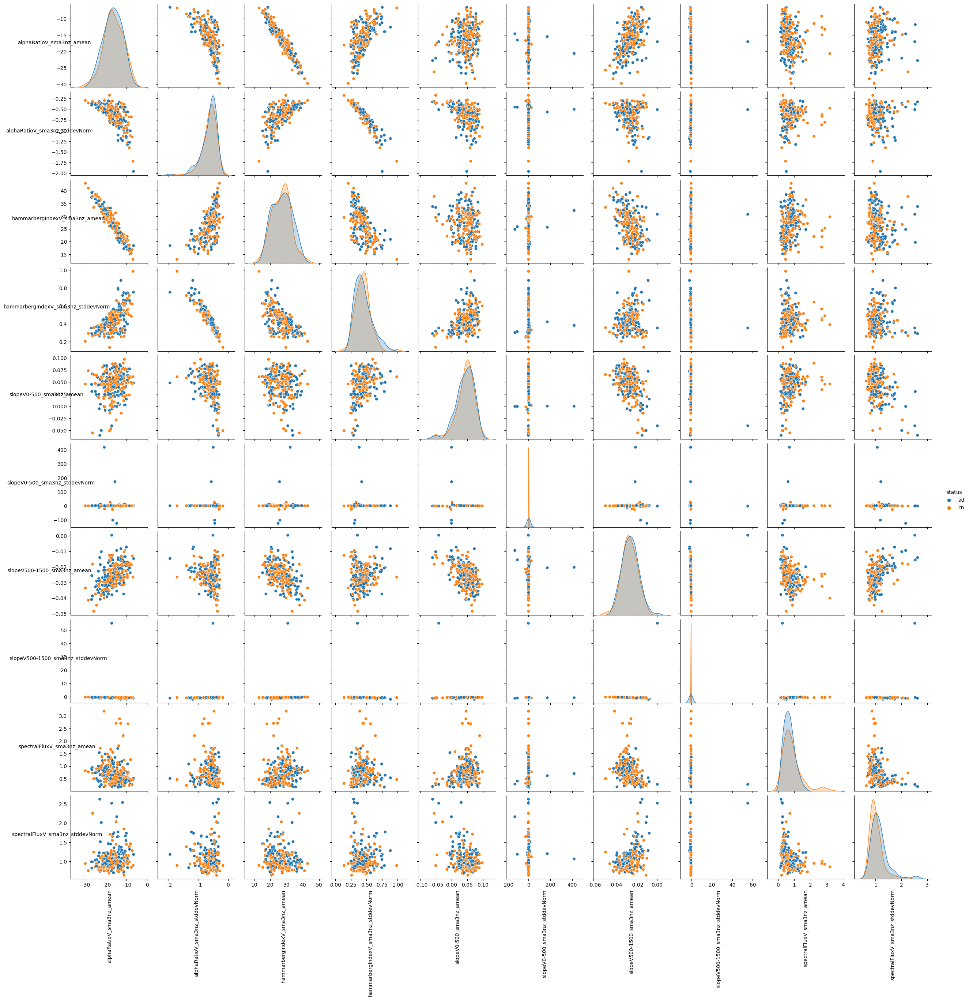

In [109]:
g = sns.pairplot(combined_data[slope_alphaV_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_37748\1628948135.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[slope_alphaV_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between slope_alphaV features')

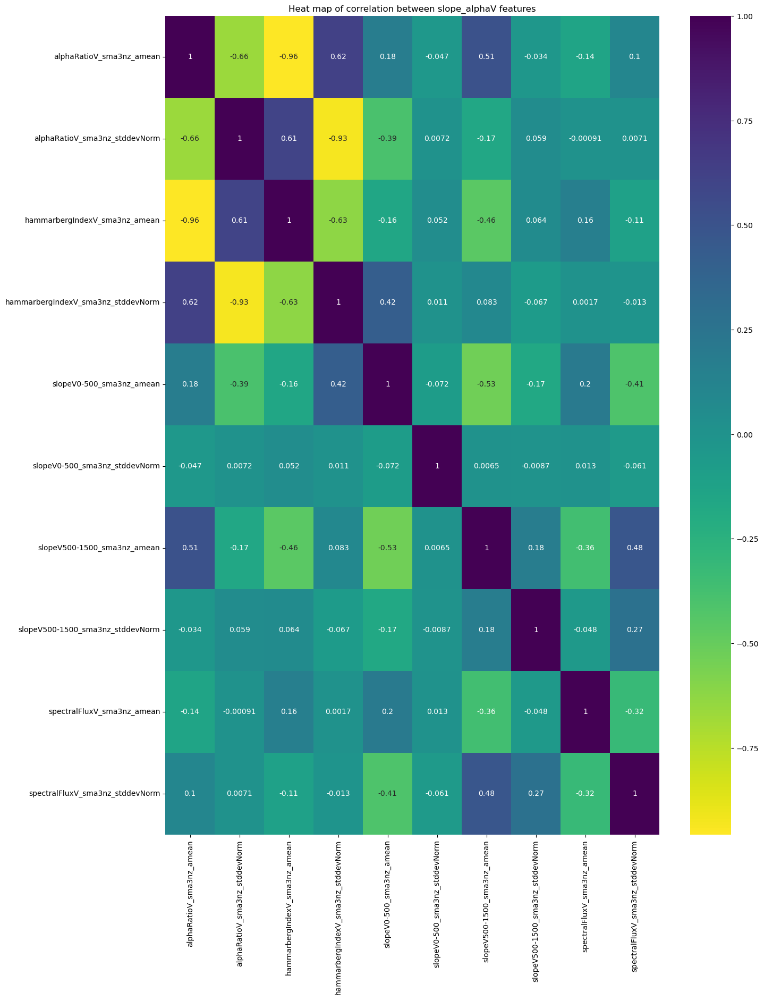

In [110]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[slope_alphaV_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between slope_alphaV features')

In [111]:
# Looks like alpha mean, std correlated with hammarberg mean and std - so dropped both hammarberg features

# slope_alphaV_new = ['alphaRatioV_sma3nz_amean',
#        'alphaRatioV_sma3nz_stddevNorm', 'slopeV0-500_sma3nz_amean',
#        'slopeV0-500_sma3nz_stddevNorm', 'slopeV500-1500_sma3nz_amean',
#        'slopeV500-1500_sma3nz_stddevNorm','spectralFluxV_sma3nz_amean',
#        'spectralFluxV_sma3nz_stddevNorm']

slope_alphaV_new = ['slopeV0-500_sma3nz_stddevNorm','slopeV500-1500_sma3nz_stddevNorm','spectralFluxV_sma3nz_amean',
       'spectralFluxV_sma3nz_stddevNorm']

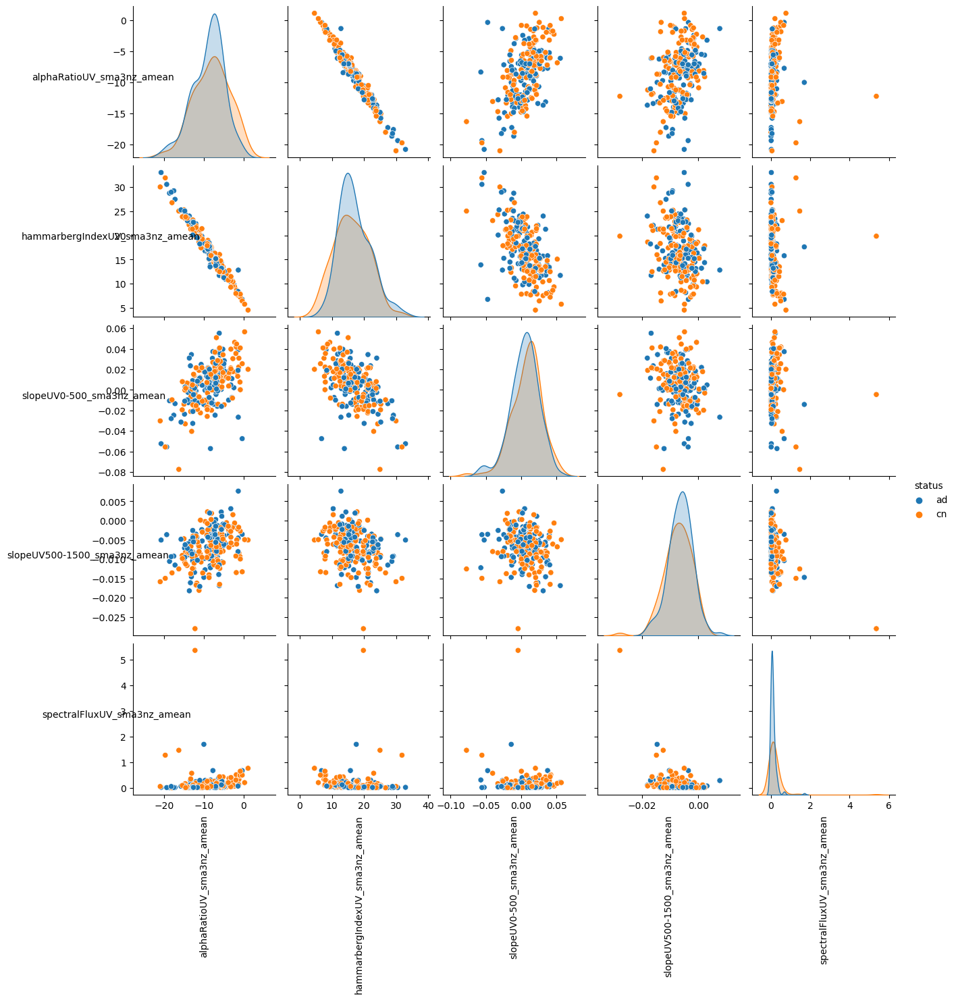

In [112]:
g = sns.pairplot(combined_data[slope_alphaUV_feature_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_37748\1996604138.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[slope_alphaUV_feature_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between slope_alphaUV features')

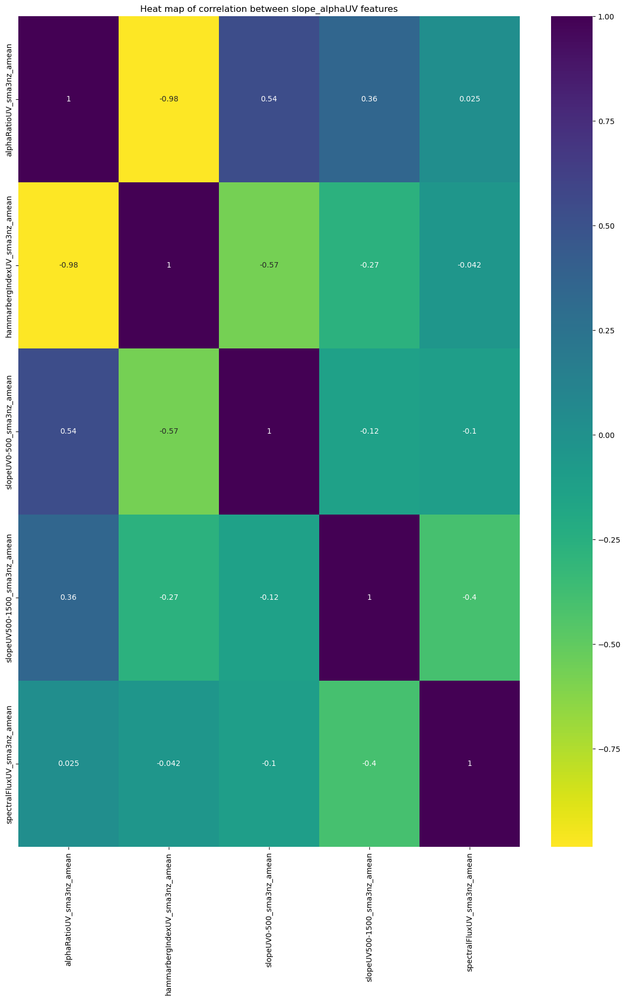

In [113]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[slope_alphaUV_feature_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between slope_alphaUV features')

In [114]:
slope_alphaUV_new = ['spectralFluxUV_sma3nz_amean']

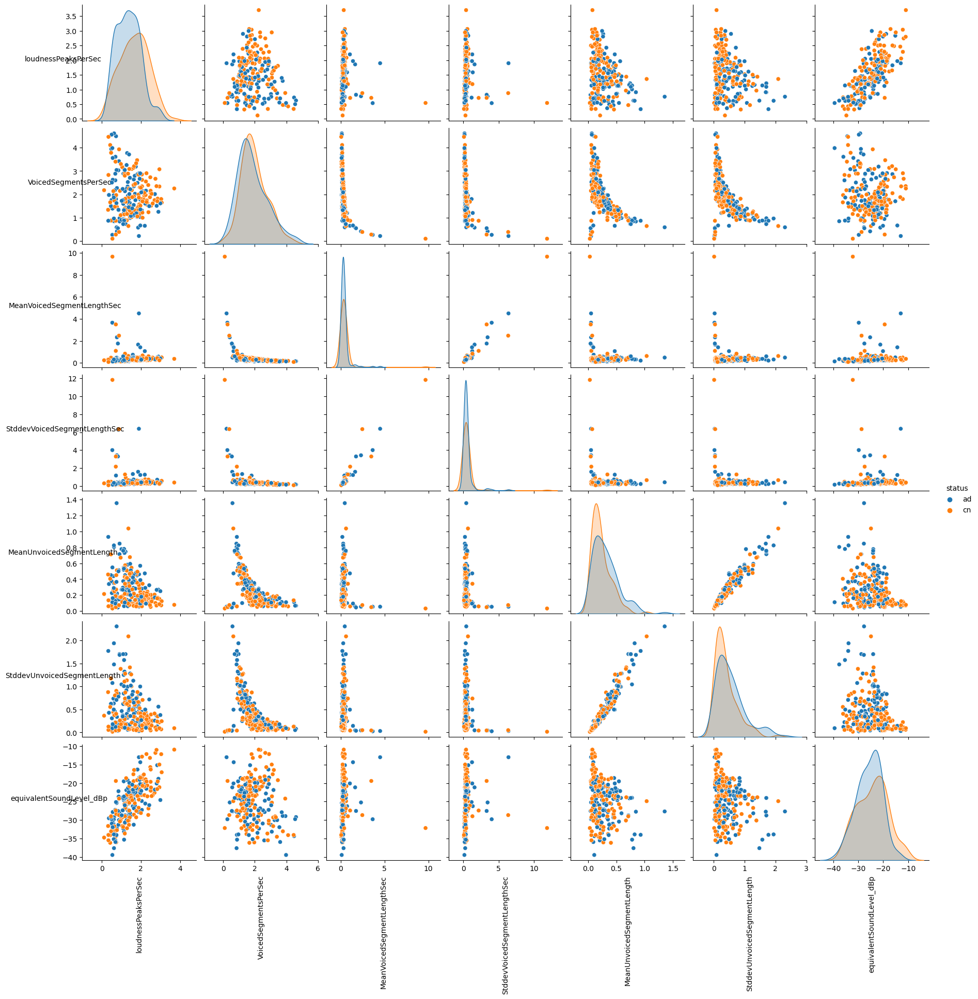

In [115]:
g = sns.pairplot(combined_data[other_features_set],hue='status')
for ax in g.axes.flatten():
    # rotate x axis labels
    ax.set_xlabel(ax.get_xlabel(), rotation = 90)
    # rotate y axis labels
    ax.set_ylabel(ax.get_ylabel(), rotation = 0)

C:\Users\Nadun\AppData\Local\Temp\ipykernel_37748\2274926652.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(combined_data[other_features_set].corr(),cmap='viridis_r',annot=True);


Text(0.5, 1.0, 'Heat map of correlation between other features')

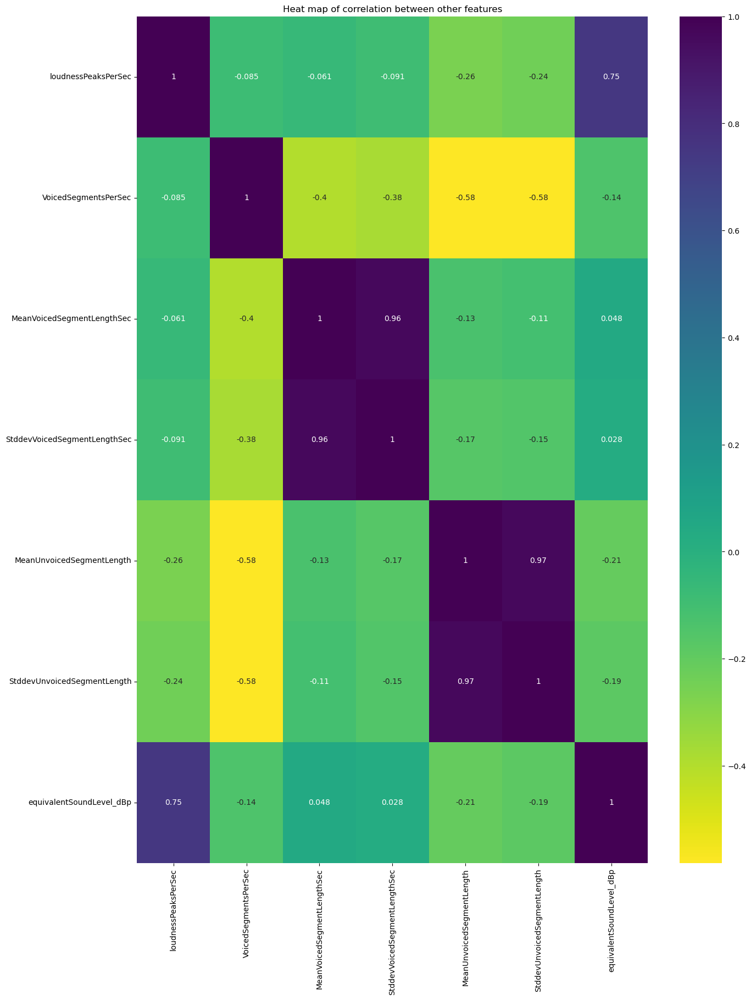

In [116]:
plt.subplots(figsize=(15,20))
sns.heatmap(combined_data[other_features_set].corr(),cmap='viridis_r',annot=True);
plt.title('Heat map of correlation between other features')

In [118]:
other_new = ['loudnessPeaksPerSec', 'MeanVoicedSegmentLengthSec', 'MeanUnvoicedSegmentLength', 'equivalentSoundLevel_dBp']

In [ ]:
#### Let's look at some UMAP vizulatization!

In [119]:
 kept_features = F0_new+loudness_new+spectral_flux_new + mfcc_new +jitter_new + log_rel_new + F1_new + F2_new + F3_new + slope_alphaV_new + slope_alphaUV_new + other_new 

In [120]:
len(kept_features)

37

In [121]:
df = combined_data[kept_features]
df['status'] = combined_data['status']
df.shape

C:\Users\Nadun\AppData\Local\Temp\ipykernel_37748\2578238243.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['status'] = combined_data['status']


(237, 38)

In [122]:
df.head()

,F0semitoneFrom27.5Hz_sma3nz_amean,F0semitoneFrom27.5Hz_sma3nz_pctlrange0-2,F0semitoneFrom27.5Hz_sma3nz_meanFallingSlope,loudness_sma3_amean,loudness_sma3_stddevNorm,loudness_sma3_stddevFallingSlope,spectralFlux_sma3_amean,spectralFlux_sma3_stddevNorm,mfcc2_sma3_stddevNorm,mfcc3_sma3_stddevNorm,...,slopeV0-500_sma3nz_stddevNorm,slopeV500-1500_sma3nz_stddevNorm,spectralFluxV_sma3nz_amean,spectralFluxV_sma3nz_stddevNorm,spectralFluxUV_sma3nz_amean,loudnessPeaksPerSec,MeanVoicedSegmentLengthSec,MeanUnvoicedSegmentLength,equivalentSoundLevel_dBp,status
audio file,,,,,,,,,,,,,,,,,,,,,
adrso024,22.836117,7.935173,150.88577,0.549328,0.831140,5.262211,0.508837,1.326787,1.659299,2.070628,...,0.882923,-0.567350,0.550346,1.225269,0.163655,1.585821,0.733627,0.100488,-26.253954,ad
adrso025,25.950464,11.863705,177.42262,0.398178,1.058877,5.992081,0.200731,1.719531,1.825399,1.010119,...,0.633215,-0.695343,0.327789,1.311078,0.069983,0.774302,0.213387,0.221147,-32.320164,ad
adrso027,19.768696,11.135247,167.47725,0.460953,0.707600,5.662509,0.207583,1.357751,0.648870,1.462580,...,12.945907,-0.940123,0.283992,1.236332,0.134296,0.727537,0.099811,0.112874,-34.366104,ad
adrso028,22.070637,13.376965,147.31458,0.399583,1.533441,8.396350,0.202821,2.647187,3.380660,1.010571,...,1.270049,-0.652363,0.235273,2.537468,0.118246,0.482315,0.174490,0.069385,-28.948114,ad
adrso031,29.309093,22.327736,136.47410,0.358402,0.733677,9.875219,0.149938,1.618128,0.852065,1.973424,...,1.526530,-0.909497,0.223593,1.312532,0.083634,0.689995,0.171469,0.208814,-35.530070,ad


C:\Users\Nadun\anaconda3\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<AxesSubplot: >

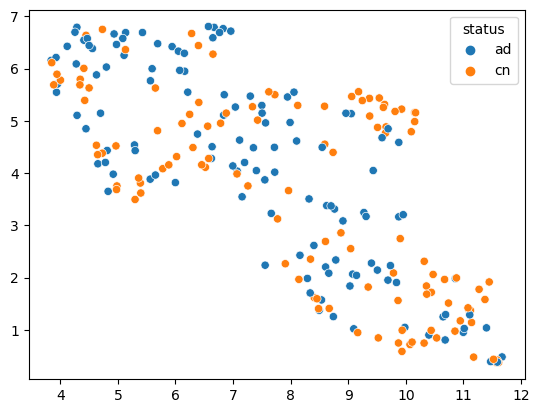

In [126]:
# I tried changing n_neighbors but didn't get any interesting results!

umap_ = umap.UMAP(n_components=2, 
                  n_neighbors= 15, 
                  random_state=42)

umap_r = umap_.fit_transform(df.iloc[:,:-1])

CI = np.linspace(1,166,166)
#CI = np.linspace(1,3,3)

sns.scatterplot(x = umap_r[:, 0], 
            y = umap_r[:, 1],
            hue=df.status)

#### I tried changing n_neighbors but didn't get any interesting results!

#### Overall we have kept 37 features!

### Let's try PCA again with reduced features!

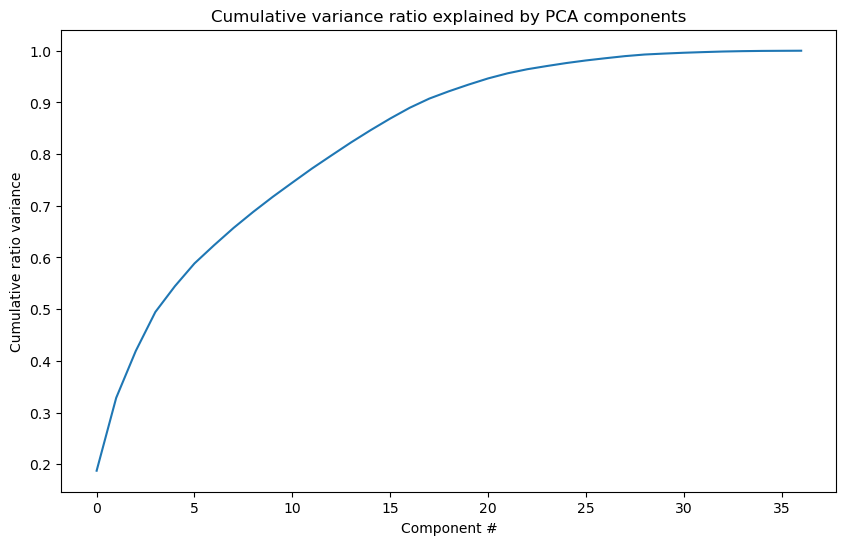

In [127]:
df_scale = scale(df.iloc[:,:-1])
ad_pca = PCA().fit(df_scale)
plt.subplots(figsize=(10, 6))
plt.plot(ad_pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
#plt.xticks(np.arange(0,100,1))
plt.title('Cumulative variance ratio explained by PCA components');

In [128]:
ad_pca.explained_variance_ratio_.cumsum()
# No difference - it still takes about 10 PCA's for 70% variation

array([0.18744101, 0.32845879, 0.41913244, 0.49449928, 0.54445803,
       0.5884936 , 0.62365272, 0.65725089, 0.68816109, 0.71733171,
       0.74484835, 0.77201866, 0.79746978, 0.82260086, 0.84631024,
       0.86877553, 0.88967255, 0.90742562, 0.9215342 , 0.93441949,
       0.94638985, 0.95630085, 0.9641611 , 0.97035875, 0.97616569,
       0.98117757, 0.98549128, 0.98955145, 0.99266155, 0.99448143,
       0.99607248, 0.99733549, 0.99845323, 0.99918323, 0.99963366,
       0.99982888, 1.        ])

Overall, PCA didn't change much by reducing the feature set. However, I much more comfortable with this 37 feature set than previous iterations of this. Let me know what you guys think!